In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.cm as cm
import seaborn as sns
from gamap_colormap import WhGrYlRd

plt.rcParams.update({'font.size': 22})

import warnings
warnings.filterwarnings("ignore")
from lunarcalendar import Converter, Solar, Lunar, DateNotExist
import pandas as pd
from datetime import datetime, timedelta

# T106

In [19]:


ln = Converter.Lunar2Solar( Lunar(year=2019, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )


mask1 = np.load('China_mask_final.npy')
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 365, axis=1)

mask2 = np.load('China_mask_final.npy')
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 115, axis=1)

fh = nc.Dataset('t106/nox_2019_t106_China.nc')
print(fh.variables['time'])
time = fh.variables['time'][:]/1440
time = np.array([datetime(2019, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time1 = np.array([s.days for s in time])
t2019 = fh.variables['nox'][:,:,:]
print(np.any(np.isnan(t2019)))
fh.close()

ln = Converter.Lunar2Solar( Lunar(year=2020, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t106/nox_2020_t106_China.nc')
print(fh.variables['time'])
time = fh.variables['time'][:]/1440
time = np.array([datetime(2020, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time2 = np.array([s.days for s in time])
t2020 = fh.variables['nox'][:,:,:]
fh.close()

# print(t2019.shape, t2020.shape)
print(time1.shape, time2.shape)

pred = t2019*mask1[0]
pred2 = t2020*mask2[0]

# print(pred.shape, pred2.shape)

# print(time1)
# print(time2)

print(time1[50:64]) # 14 -- 28
print(time2[14:21]) # -10 -- -3
print(time2[39:53]) # 14 -- 28

before20 = np.mean(pred2[14:21], axis=0)    # -10 -- -3
after19 = np.mean(pred[50:64], axis=0)     # 14 -- 28
after20 = np.mean(pred2[39:53], axis=0)  # 14 -- 28

print(np.nanmean(before20), np.nanmean(after20))

err3 = (np.nanmean(after20) - np.nanmean(before20))/np.nanmean(before20) * 100
err4 = (np.nanmean(after20) - np.nanmean(after19))/np.nanmean(after19) * 100

print(np.nanmean(err3), np.nanmean(err4))

mask0 = np.load('masks/China_mask_final.npy', allow_pickle=True)[0]
mask1 = np.load('masks/JJJ_mask.npy', allow_pickle=True)
mask2 = np.load('masks/Yangtze_mask.npy', allow_pickle=True)
mask3 = np.load('masks/Pearl_mask.npy', allow_pickle=True)
print(mask1.shape, mask2.shape, mask3.shape)
mask0[mask0 == 0] = np.nan
mask1[mask1 == 0] = np.nan
mask2[mask2 == 0] = np.nan
mask3[mask3 == 0] = np.nan

print('JJJ, YRD, PRD: ')

print(np.nanmean(before20*mask1), np.nanmean(after20*mask1))
print(np.nanmean(before20*mask2), np.nanmean(after20*mask2))
print(np.nanmean(before20*mask3), np.nanmean(after20*mask3))

err3 = (np.nanmean(after20*mask1) - np.nanmean(before20*mask1))/np.nanmean(before20*mask1) * 100
err4 = (np.nanmean(after20*mask1) - np.nanmean(after19*mask1))/np.nanmean(after19*mask1) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask2) - np.nanmean(before20*mask2))/np.nanmean(before20*mask2) * 100
err4 = (np.nanmean(after20*mask2) - np.nanmean(after19*mask2))/np.nanmean(after19*mask2) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask3) - np.nanmean(before20*mask3))/np.nanmean(before20*mask3) * 100
err4 = (np.nanmean(after20*mask3) - np.nanmean(after19*mask3))/np.nanmean(after19*mask3) * 100
print(np.nanmean(err3), np.nanmean(err4))

<class 'netCDF4._netCDF4.Variable'>
float64 time(time)
    long_name: Time
    units: minutes since 2019-01-01 00:00
unlimited dimensions: 
current shape = (365,)
filling on, default _FillValue of 9.969209968386869e+36 used
False
<class 'netCDF4._netCDF4.Variable'>
float64 time(time)
    long_name: Time
    units: minutes since 2020-01-01 00:00
unlimited dimensions: 
current shape = (115,)
filling on, default _FillValue of 9.969209968386869e+36 used
(365,) (115,)
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
[-10  -9  -8  -7  -6  -5  -4]
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
2.8013756525770798e-11 2.2276710138384648e-11
-20.479389767339658 -11.939327087073046
(35, 46) (35, 46) (35, 46)
JJJ, YRD, PRD: 
9.701433482162658e-11 7.4188369821593e-11
9.726316679683317e-11 7.289769609092664e-11
5.59101688387176e-11 3.802718308622636e-11
-23.528445607550758 -25.962036427585268
-25.051076896151248 1.4095190780413542
-31.9852114989632 0.25889710852087167


In [10]:
# DL

In [27]:
mask1 = np.load('China_mask_final.npy')
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_mask_final.npy')
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

ln = Converter.Lunar2Solar( Lunar(year=2019, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t106/nox_2019_t106_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2019, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time1 = np.array([s.days for s in time])
time1 = time1[1:]
fh.close()

ln = Converter.Lunar2Solar( Lunar(year=2020, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t106/nox_2020_t106_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2020, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time2 = np.array([s.days for s in time])
time2 = time2[1:]
fh.close()


pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))
pred = pred*mask1[0]

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))
pred2 = pred2*mask2[0]

print(pred.shape, pred2.shape)

# before20 = np.mean(pred2[3:13], axis=0)    # -10 -- -20
# after19 = np.mean(pred[45:55], axis=0)     # 10 -- 20
# after20 = np.mean(pred2[34:44], axis=0)  # 10 -- 20

print(time1[49:63])  # 14 -- 28
print(time2[13:20])   # -10 -- -3
print(time2[38:52])  # 14 -- 28

before20 = np.mean(pred2[13:20], axis=0)    
after19 = np.mean(pred[49:63], axis=0)     
after20 = np.mean(pred2[38:52], axis=0)  

print(np.nanmean(before20), np.nanmean(after20))


err3 = (np.nanmean(after20) - np.nanmean(before20))/np.nanmean(before20) * 100
err4 = (np.nanmean(after20) - np.nanmean(after19))/np.nanmean(after19) * 100

print(np.nanmean(err3), np.nanmean(err4))

mask0 = np.load('masks/China_mask_final.npy')[0]
mask1 = np.load('masks/JJJ_mask.npy')
mask2 = np.load('masks/Yangtze_mask.npy')
mask3 = np.load('masks/Pearl_mask.npy')
print(mask1.shape, mask2.shape, mask3.shape)
mask0[mask0 == 0] = np.nan
mask1[mask1 == 0] = np.nan
mask2[mask2 == 0] = np.nan
mask3[mask3 == 0] = np.nan


print('JJJ, YRD, PRD: ')

print(np.nanmean(before20*mask1), np.nanmean(after20*mask1))
print(np.nanmean(before20*mask2), np.nanmean(after20*mask2))
print(np.nanmean(before20*mask3), np.nanmean(after20*mask3))



err3 = (np.nanmean(after20*mask1) - np.nanmean(before20*mask1))/np.nanmean(before20*mask1) * 100
err4 = (np.nanmean(after20*mask1) - np.nanmean(after19*mask1))/np.nanmean(after19*mask1) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask2) - np.nanmean(before20*mask2))/np.nanmean(before20*mask2) * 100
err4 = (np.nanmean(after20*mask2) - np.nanmean(after19*mask2))/np.nanmean(after19*mask2) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask3) - np.nanmean(before20*mask3))/np.nanmean(before20*mask3) * 100
err4 = (np.nanmean(after20*mask3) - np.nanmean(after19*mask3))/np.nanmean(after19*mask3) * 100
print(np.nanmean(err3), np.nanmean(err4))

(364, 35, 46) (114, 35, 46)
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
[-10  -9  -8  -7  -6  -5  -4]
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
29.77764087361931 25.99693835550907
-12.696447425624136 -12.50338236209372
(35, 46) (35, 46) (35, 46)
JJJ, YRD, PRD: 
114.18976552871588 86.92222316265106
103.67599225725446 84.16749868052345
61.122524168194175 54.95523281097464
-23.87914734723552 -16.508560856155256
-18.81678983917895 -13.621352540241539
-10.090046903574633 -1.6753804887847592


In [12]:
# New T213

ln = Converter.Lunar2Solar( Lunar(year=2019, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )


mask1 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 147, axis=1)

mask2 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 111, axis=1)

# print(mask1.shape, mask2.shape)

fh = nc.Dataset('t213/new/nox_2019_t213_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2019, 1, 5, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time1 = np.array([s.days for s in time])
# print(fh.variables['nox'])
t2019 = fh.variables['nox'][:,23:,:]
fh.close()

# print(time1.shape, t2019.shape)

ln = Converter.Lunar2Solar( Lunar(year=2020, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t213/new/nox_2020_t213_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2020, 1, 5, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time2 = np.array([s.days for s in time])
t2020 = fh.variables['nox'][:]
fh.close()

# print(t2019.shape, t2020.shape)
print(time1.shape, time2.shape)

pred = t2019*mask1[0]
pred2 = t2020*mask2[0]

print(pred.shape, pred2.shape)


print(time1[46:60])
print(time2[10:17])
print(time2[35:49])

before20 = np.mean(pred2[10:17], axis=0)    # -20 -- -14 
after19 = np.mean(pred[46:60], axis=0)     # 14 -- 28
after20 = np.mean(pred2[35:49], axis=0)  # 14 -- 28

print(np.nanmean(before20), np.nanmean(after20))

err3 = (np.nanmean(after20) - np.nanmean(before20))/np.nanmean(before20) * 100
err4 = (np.nanmean(after20) - np.nanmean(after19))/np.nanmean(after19) * 100

print(np.nanmean(err3), np.nanmean(err4))

mask0 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)[0]
mask1 = np.load('masks/JJJ_mask_t213.npy', allow_pickle=True)
mask2 = np.load('masks/Yangtze_mask_t213.npy', allow_pickle=True)
mask3 = np.load('masks/Pearl_mask_t213.npy', allow_pickle=True)
print(mask1.shape, mask2.shape, mask3.shape)
mask0[mask0 == 0] = np.nan
mask1[mask1 == 0] = np.nan
mask2[mask2 == 0] = np.nan
mask3[mask3 == 0] = np.nan

print('JJJ, YRD, PRD: ')

print(np.nanmean(before20*mask1), np.nanmean(after20*mask1))
print(np.nanmean(before20*mask2), np.nanmean(after20*mask2))
print(np.nanmean(before20*mask3), np.nanmean(after20*mask3))

err3 = (np.nanmean(after20*mask1) - np.nanmean(before20*mask1))/np.nanmean(before20*mask1) * 100
err4 = (np.nanmean(after20*mask1) - np.nanmean(after19*mask1))/np.nanmean(after19*mask1) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask2) - np.nanmean(before20*mask2))/np.nanmean(before20*mask2) * 100
err4 = (np.nanmean(after20*mask2) - np.nanmean(after19*mask2))/np.nanmean(after19*mask2) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask3) - np.nanmean(before20*mask3))/np.nanmean(before20*mask3) * 100
err4 = (np.nanmean(after20*mask3) - np.nanmean(after19*mask3))/np.nanmean(after19*mask3) * 100
print(np.nanmean(err3), np.nanmean(err4))

(147,) (111,)
(147, 68, 91) (111, 68, 91)
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
[-10  -9  -8  -7  -6  -5  -4]
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
1.8067565430177667e-11 1.4910252085517438e-11
-17.475034790169747 -20.51408253987452
(68, 91) (68, 91) (68, 91)
JJJ, YRD, PRD: 
4.979726238400657e-11 3.406206279818812e-11
5.926648486775716e-11 3.8206141600625664e-11
4.1066806263460416e-11 3.194754594489586e-11
-31.59852335752525 -32.89891439227715
-35.53499640500695 -32.22621550737244
-22.2059155515059 -12.440812648173914


In [21]:
# Old T213

ln = Converter.Lunar2Solar( Lunar(year=2019, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )


mask1 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 137, axis=1)

mask2 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 101, axis=1)

fh = nc.Dataset('t213/nox_2019_t213_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2019, 1, 15, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time1 = np.array([s.days for s in time])
t2019 = fh.variables['nox'][:,:,:]
fh.close()

ln = Converter.Lunar2Solar( Lunar(year=2020, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t213/nox_2020_t213_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2020, 1, 15, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time2 = np.array([s.days for s in time])
t2020 = fh.variables['nox'][:,:,:]
fh.close()

# print(t2019.shape, t2020.shape)
print(time1.shape, time2.shape)

pred = t2019*mask1[0]
pred2 = t2020*mask2[0]

# print(pred.shape, pred2.shape)

# print(time1)
# print(time2)

print(time1[36:50])
print(time2[:7])
print(time2[25:39])

before20 = np.mean(pred2[:7], axis=0)    # -10 -- -3
after19 = np.mean(pred[36:50], axis=0)     # 14 -- 28
after20 = np.mean(pred2[25:39], axis=0)  # 14 -- 28

print(np.nanmean(before20), np.nanmean(after20))

err3 = (np.nanmean(after20) - np.nanmean(before20))/np.nanmean(before20) * 100
err4 = (np.nanmean(after20) - np.nanmean(after19))/np.nanmean(after19) * 100

print(np.nanmean(err3), np.nanmean(err4))

mask0 = np.load('masks/China_masks_t213_final.npy', allow_pickle=True)[0]
mask1 = np.load('masks/JJJ_mask_t213.npy', allow_pickle=True)
mask2 = np.load('masks/Yangtze_mask_t213.npy', allow_pickle=True)
mask3 = np.load('masks/Pearl_mask_t213.npy', allow_pickle=True)
print(mask1.shape, mask2.shape, mask3.shape)
mask0[mask0 == 0] = np.nan
mask1[mask1 == 0] = np.nan
mask2[mask2 == 0] = np.nan
mask3[mask3 == 0] = np.nan

print('JJJ, YRD, PRD: ')

print(np.nanmean(before20*mask1), np.nanmean(after20*mask1))
print(np.nanmean(before20*mask2), np.nanmean(after20*mask2))
print(np.nanmean(before20*mask3), np.nanmean(after20*mask3))

err3 = (np.nanmean(after20*mask1) - np.nanmean(before20*mask1))/np.nanmean(before20*mask1) * 100
err4 = (np.nanmean(after20*mask1) - np.nanmean(after19*mask1))/np.nanmean(after19*mask1) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask2) - np.nanmean(before20*mask2))/np.nanmean(before20*mask2) * 100
err4 = (np.nanmean(after20*mask2) - np.nanmean(after19*mask2))/np.nanmean(after19*mask2) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask3) - np.nanmean(before20*mask3))/np.nanmean(before20*mask3) * 100
err4 = (np.nanmean(after20*mask3) - np.nanmean(after19*mask3))/np.nanmean(after19*mask3) * 100
print(np.nanmean(err3), np.nanmean(err4))

(137,) (101,)
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
[-10  -9  -8  -7  -6  -5  -4]
[15 16 17 18 19 20 21 22 23 24 25 26 27 28]
1.8067565430177667e-11 1.4910252085517438e-11
-17.475034790169747 -20.51408253987452
(68, 91) (68, 91) (68, 91)
JJJ, YRD, PRD: 
4.979726238400657e-11 3.406206279818812e-11
5.926648486775716e-11 3.8206141600625664e-11
4.1066806263460416e-11 3.194754594489586e-11
-31.59852335752525 -32.89891439227715
-35.53499640500695 -32.22621550737244
-22.2059155515059 -12.440812648173914


# Scatter

In [77]:
# 2018
# TCR-2 NO2 vs NOx
# In situi NO2 vs NOx

x1 = np.load('scatter_plots_data/XY_p1/X_2018.npy')[:, :, :, 0]
y1 = np.load('scatter_plots_data/XY_p1/Y_2018.npy')[:, :, :, 0]*1e12

x2 = np.load('scatter_plots_data/XY_p2/X_2018.npy')[:, :, :, 0]
y2 = np.load('scatter_plots_data/XY_p2/Y_pred_2018.npy')[:, :, :, 0]


x3 = np.load('scatter_plots_data/XY_p2/X_2018.npy')[:, :, :, 0]
y3 = np.load('scatter_plots_data/XY_p2/Y_pred_2018.npy')[:, :, :, 0]

In [78]:
x1 = x1.flatten()
y1 = y1.flatten()

y2 = y2[np.where(~np.isnan(x2))]
x2 = x2[np.where(~np.isnan(x2))]

Text(0,0.5,'NOx emission (x 10$^{-12}$  kgN/m$^2$/s)')

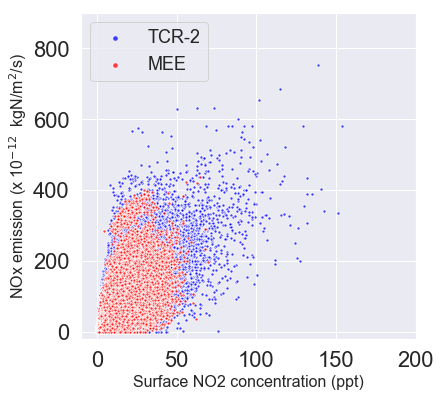

In [85]:
plt.figure(figsize=(6, 6))
plt.scatter(x1.flatten(), y1.flatten(), s=10, label='TCR-2', edgecolor='white', facecolors='blue', alpha=0.75)
plt.scatter(x2.flatten(), y2.flatten(), s=10, label='MEE', edgecolor='white', facecolors='red', alpha=0.75)
lgnd = plt.legend(loc=2, fontsize=18)
lgnd.legendHandles[0]._sizes = [30]
lgnd.legendHandles[1]._sizes = [30]

plt.xlim((-10, 200))
plt.ylim((-20, 900))

plt.xlabel(r'Surface NO2 concentration (ppt)', fontsize=16)
plt.ylabel(r'NOx emission (x 10$^{-12}$  kgN/m$^2$/s)', fontsize=16)

# Time series

(364, 35, 46) (364, 35, 46)
116.39 40.05 32 20
1.0511943612128891
121.45 31.21 37 12
8.932952528829983
113.35 23.19 30 5
8.577452382349083
113.92 30.92 30 12
-0.7779246257393023
114.47 38.03 31 18
2.6407665470561525
116.97 36.65 33 17
5.352636632877186
117.24 31.85 33 13
-5.186693165376993
113.16 27.86 30 9
-5.279512490111344


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\legend.py:640: UserWarning: Unrecognized location "upper_center". Falling back on "best"; valid locations are
	best
	upper right
	upper left
	lower left
	lower right
	right
	center left
	center right
	lower center
	upper center
	center

  % (loc, '\n\t'.join(self.codes)))


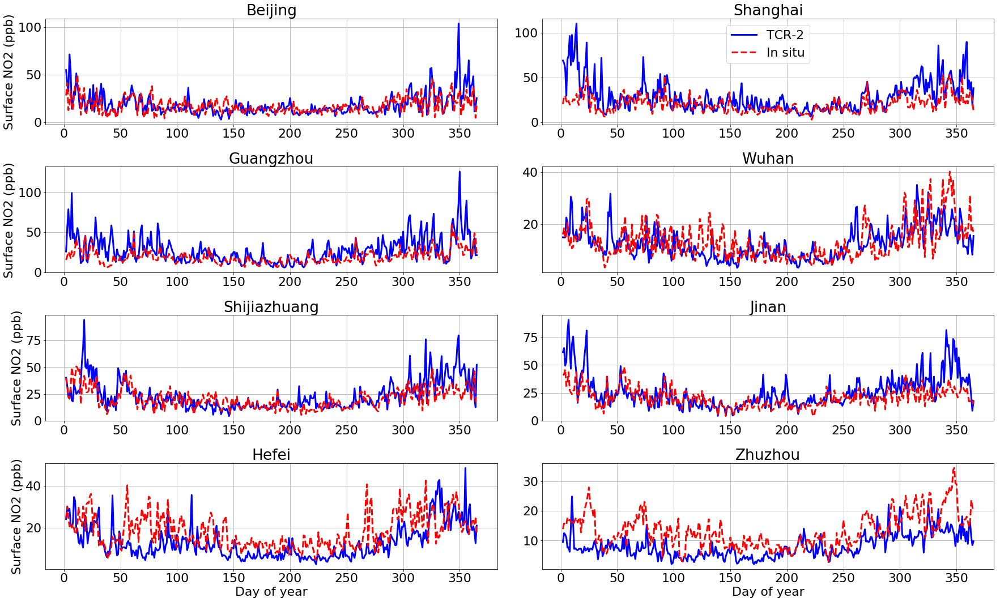

In [7]:
fh = nc.Dataset('no2_2019_t106_China.nc')
lon =  fh.variables['lon'][:]
lat = fh.variables['lat'][:]
tcrlr = fh.variables['no2'][1:]/1e3
fh.close()


pred = np.load('X_p2_filled/X_2019.npy')
# pred = np.load('X_p2/X_2019.npy')
pred = pred[:, :, :, 0]

print(tcrlr.shape, pred.shape)




df = pd.read_table('China_obs.txt', delimiter=',')
df = df[df['Date'].str.contains("2019")]


cities = [ 'beijing', 'shanghai', 'guangzhou', 'xiaogan', 'shijiazhuang', 'jinan', 
          'hefei', 'zhuzhou' ]

titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Wuhan', 'Shijiazhuang', 'Jinan', 
          'Hefei', 'Zhuzhou' ]

fig = plt.figure(figsize=(25, 15))
curr = 1
for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

#     time  = subnow['Date'].values

#     time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

#     doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    
    
    ix = np.argmin( abs(lonnow - lon) )
    iy = np.argmin( abs(latnow - lat) )
    
    print(lonnow, latnow, ix, iy)
    
    lrnow = tcrlr[:, iy, ix]
    
    insitu = pred[:, iy, ix]
    
    print( np.mean(lrnow - insitu) )
    
    ax = plt.subplot(4, 2, curr)
    
    xx = np.arange(2, 366, 1)

    ax.plot(xx, lrnow, 'b-', lw=3, label='TCR-2')
    ax.grid()

    
    ax.plot(xx, insitu, 'r--', lw=3, label='In situ')
    
    
#     xx = np.arange(15, 15+107, 1)
#     ax.plot(xx, hrnow[:-30], label='TCR-2 High-Res')
#     ax.grid()
#     plt.ylabel('Surf NO2 (ppb)')
#     plt.xlabel('Day of year')
    plt.title(titles[cities.index(cc)])
    
    curr += 1
    
# plt.subplots(4, 2, 8)
# plt.ylabel('Surface NO2 (ppb)')
allaxes = fig.get_axes()
allaxes[6].set_xlabel('Day of year')
allaxes[7].set_xlabel('Day of year')

allaxes[0].set_ylabel('Surface NO2 (ppb)')
allaxes[2].set_ylabel('Surface NO2 (ppb)')
allaxes[4].set_ylabel('Surface NO2 (ppb)')
allaxes[6].set_ylabel('Surface NO2 (ppb)')
allaxes[1].legend(loc='upper_center')
plt.subplots_adjust(left=0.05, wspace=0.1, hspace=0.4, right=0.98, top=0.95, bottom=0.05)

plt.savefig('NO2_station_comp.png', dpi=300)

9.14 (8.72) & 3.20 (10.78) & 4.04 (11.67) & 1.70 (6.12)
20.23 (13.29) & 9.65 (12.43) & 8.31 (12.41) & 15.81 (12.62)
15.61 (13.72) & 5.09 (7.55) & 14.14 (8.22) & 3.60 (2.22)
16.11 (17.89) & 24.71 (37.42) & 15.32 (26.71) & 0.69 (5.04)
21.26 (6.87) & 5.42 (4.68) & 9.59 (14.81) & 0.36 (-0.80)
8.31 (8.45) & -1.50 (7.60) & 4.98 (23.11) & 0.88 (11.01)
-2.55 (1.52) & 1.40 (11.67) & 12.62 (32.60) & 0.69 (19.68)
6.75 (11.16) & -2.82 (3.71) & 5.41 (19.60) & -6.08 (5.81)
14.96 (15.05) & 6.03 (12.58) & 17.05 (17.17) & 0.27 (4.73)
9
28.61 (0.45) & 11.26 (24.52) & 37.03 (62.28) & 24.31 (7.67)
16.76 (0.61) & 5.14 (1.86) & 27.02 (15.79) & 15.30 (6.78)
22.12 (19.47) & 18.80 (8.43) & 40.02 (37.20) & 14.16 (10.26)
22.00 (31.57) & 3.09 (7.15) & 19.55 (33.98) & 5.74 (14.31)


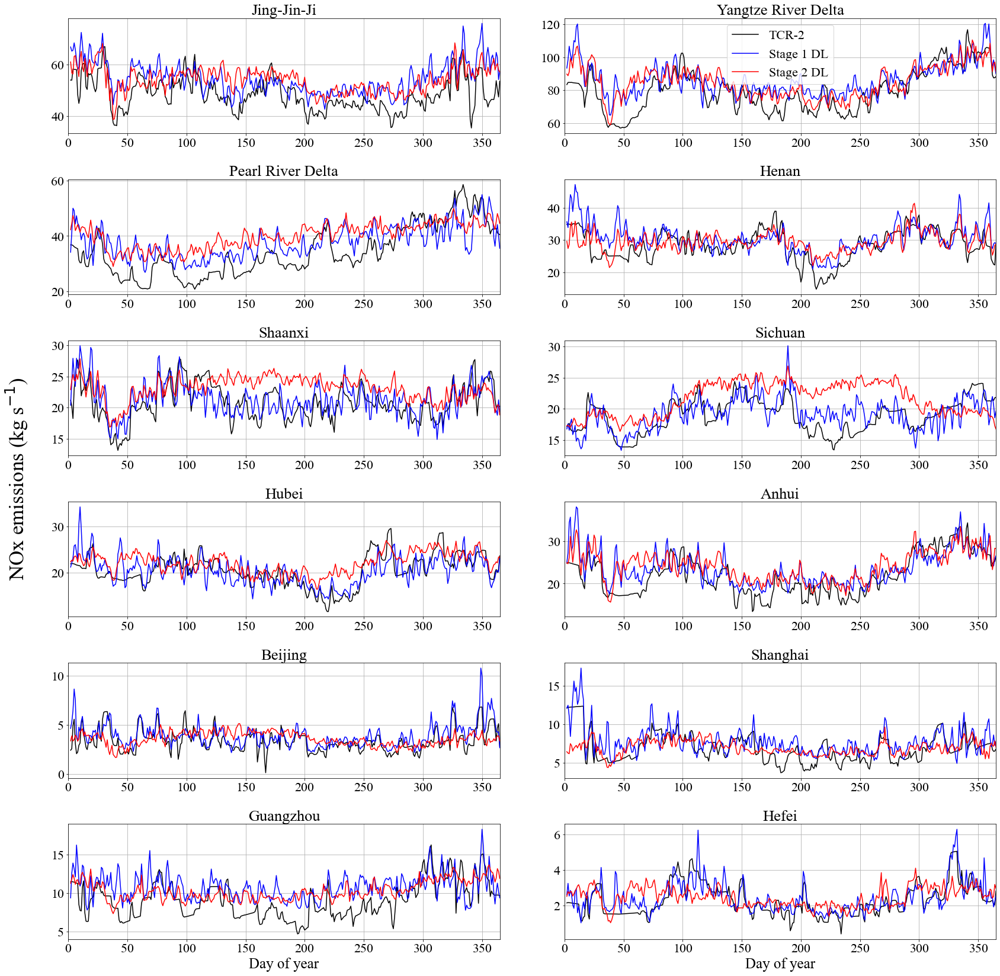

In [41]:
areat106 = np.load('surf_area_t106.npy')
areat106 = np.repeat(areat106[np.newaxis, :, :], 364, 0)

df = pd.read_table('China_obs.txt', delimiter=',')
df = df[df['Date'].str.contains("2019")]

cities = [ 'beijing', 'shanghai', 'guangzhou', 'hefei' ]
_titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Hefei' ]
xx = np.arange(2, 366, 1)

fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]/14*30
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()
truth = truth*areat106

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))
pred = pred*areat106*1e-12/14*30

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred2 = pred2.reshape((364, 35, 46))
pred2 = pred2*areat106*1e-12/14*30

fig = plt.figure(figsize=(25, 24))
curr = 1

mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
# r2 = np.corrcoef(ts1, ts2)[1, 0]
# ax = plt.subplot(4, 2, curr)
# ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
# ax.plot(xx[:], ts2[:], 'green', label='Stage 1 DL')
# ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
# ax.grid()
# plt.title('China')
# curr += 1
# plt.xlim((0, 365))

mask = np.load('JJJ_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Jing-Jin-Ji')
curr += 1
plt.xlim((0, 365))


mask = np.load('Yangtze_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Yangtze River Delta')
curr += 1
plt.xlim((0, 365))


mask = np.load('Pearl_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Pearl River Delta')
curr += 1
plt.xlim((0, 365))


mask = np.load('China_mask_final.npy')[16]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Henan')
curr += 1
plt.xlim((0, 365))

mask = np.load('China_mask_final.npy')[27]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Shaanxi')
curr += 1
plt.xlim((0, 365))


mask = np.load('China_mask_final.npy')[23]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Sichuan')
curr += 1
plt.xlim((0, 365))


mask = np.load('China_mask_final.npy')[17]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Hubei')
curr += 1
plt.xlim((0, 365))

mask = np.load('China_mask_final.npy')[12]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nansum(truth*mask, axis=(1, 2))
ts2 = np.nansum(pred*mask, axis=(1, 2))
ts3 = np.nansum(pred2*mask, axis=(1, 2))
perr1 = (ts2-ts1)/ts1*100
perr2 = (ts3-ts1)/ts1*100
winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
spring = np.arange(61, 61+91)
summer = np.arange(61+91, 61+92+91)
fall = np.arange(61+91+91, 61+91+91+91)
# print(winter.shape, spring.shape, summer.shape, fall.shape)
print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(6, 2, curr)
ax.plot(xx[:], ts1[:], 'k-', label='TCR-2')
ax.plot(xx[:], ts2[:], 'b-', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Anhui')
curr += 1
plt.xlim((0, 365))


print(curr)
for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lons) )
    iy = np.argmin( abs(latnow - lats) )

    truthnow = truth[:, iy, ix]
    prednow = pred[:, iy, ix]
    pred2now = pred2[:, iy, ix]
    
    r2 = np.corrcoef(truthnow, prednow)[1, 0]
    
    ax = plt.subplot(6, 2, curr)
    ax.plot(xx[:], truthnow[:], 'k-', label='TCR-2')
    ax.plot(xx[:], prednow[:], 'b-', label='Stage 1 DL')
    ax.plot(xx[:], pred2now[:], 'r-', label='Stage 1 DL')
    ax.grid()
    plt.title(_titles[curr - 9])
    
    curr += 1
    plt.xlim((0, 365))

    ts1 = truthnow
    ts2 = prednow
    ts3 = pred2now
    
    perr1 = (ts2-ts1)/ts1*100
    perr2 = (ts3-ts1)/ts1*100
    winter = np.concatenate([np.arange(334, 364),np.arange(0, 61)])
    spring = np.arange(61, 61+91)
    summer = np.arange(61+91, 61+92+91)
    fall = np.arange(61+91+91, 61+91+91+91)
    # print(winter.shape, spring.shape, summer.shape, fall.shape)
    print( '%.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f) & %.2f (%.2f)'%(np.mean(perr1[winter]), np.mean(perr2[winter]),
                                                        np.mean(perr1[spring]), np.mean(perr2[spring]),
                                                        np.mean(perr1[summer]), np.mean(perr2[summer]),
                                                        np.mean(perr1[fall]), np.mean(perr2[fall]),) )


allaxes = fig.get_axes()
allaxes[10].set_xlabel('Day of year', fontsize=25)
allaxes[11].set_xlabel('Day of year', fontsize=25)

# allaxes[0].set_ylabel('NOx emissions\n'+r'(kgN s$^{-1}$)')
# allaxes[2].set_ylabel('NOx emissions\n'+r'(kgN s$^{-1}$)')
# allaxes[4].set_ylabel('NOx emissions\n'+r'(kgN s$^{-1}$)')
# allaxes[6].set_ylabel('NOx emissions\n'+r'(kgN s$^{-1}$)')
    
    
plt.subplots_adjust(left=0.08, wspace=0.15, hspace=0.4, right=0.95, top=0.95, bottom=0.05)
allaxes[1].legend()
plt.gcf().text(0.02, 0.5, 'NOx emissions '+r'(kg s$^{-1}$)', va='center', rotation='vertical', fontsize=35)

plt.savefig('p2_ts_comp.pdf', dpi=400)

In [14]:
df = pd.read_table('China_obs.txt', delimiter=',')
df = df[df['Date'].str.contains("2019")]

cities = [ 'beijing', 'shanghai', 'guangzhou', 'hefei', 'wuhan', 'zhengzhou', 'xian', 'chongqing', 'chengdu']
_titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Hefei' ]
xx = np.arange(2, 366, 1)

fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred2 = pred2.reshape((364, 35, 46))

fig = plt.figure(figsize=(25, 16))
curr = 1

mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
err2 = (ts2-ts1)/ts1*100
err3 = (ts3-ts1)/ts1*100
print('China')
print(np.mean(err2), np.std(err2))
print(np.mean(err3), np.std(err3))

mask = np.load('JJJ_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
err2 = (ts2-ts1)/ts1*100
err3 = (ts3-ts1)/ts1*100
print('JJJ')
print(np.mean(err2), np.std(err2))
print(np.mean(err3), np.std(err3))


mask = np.load('Yangtze_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
err2 = (ts2-ts1)/ts1*100
err3 = (ts3-ts1)/ts1*100
print('YTD')
print(np.mean(err2), np.std(err2))
print(np.mean(err3), np.std(err3))


mask = np.load('Pearl_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
err2 = (ts2-ts1)/ts1*100
err3 = (ts3-ts1)/ts1*100
print('PRD')
print(np.mean(err2), np.std(err2))
print(np.mean(err3), np.std(err3))




for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]
    time  = subnow['Date'].values
    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])
    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lons) )
    iy = np.argmin( abs(latnow - lats) )

    truthnow = truth[:, iy, ix]
    prednow = pred[:, iy, ix]
    pred2now = pred2[:, iy, ix]
    
    err2 = (prednow-truthnow)/truthnow*100
    err3 = (pred2now-truthnow)/truthnow*100
    print(cc)
    print(np.mean(err2), np.std(err2))
    print(np.mean(err3), np.std(err3))

China
4.345797165780627 6.158643576556744
8.88128720538106 6.111753957407051
JJJ
13.431644505873665 10.83327192049032
12.608808648773003 10.67376725631423
YTD
9.512420082085228 12.35971798786588
7.847447322085876 11.252800565141065
PRD
14.20102772661102 19.464016655528884
21.717019632324057 21.6570659513024
beijing
25.357271634615383 111.52831671558485
23.881519359546704 158.66720395890496
shanghai
16.07184039105426 22.19137674702482
6.271403889079671 23.674386837188905
guangzhou
23.78531185611264 25.80882645528733
18.82141783997253 25.567856146883493
hefei
12.598055996737637 30.33169495922168
21.745899242359204 47.926355722903494
wuhan
6.1445654565161405 20.25759682550615
6.067952921102335 16.768229111315556
zhengzhou
29.246142041552197 21.867470624482504
35.71942876459478 36.90465066106083
xian
12.226801274896978 25.10441707031252
13.068922776442308 43.652081011988464
chongqing
6.424095740685096 24.23067932050943
13.042648147750686 30.886588357239642
chengdu
10.868838132082761 28.954

<Figure size 1800x1152 with 0 Axes>

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


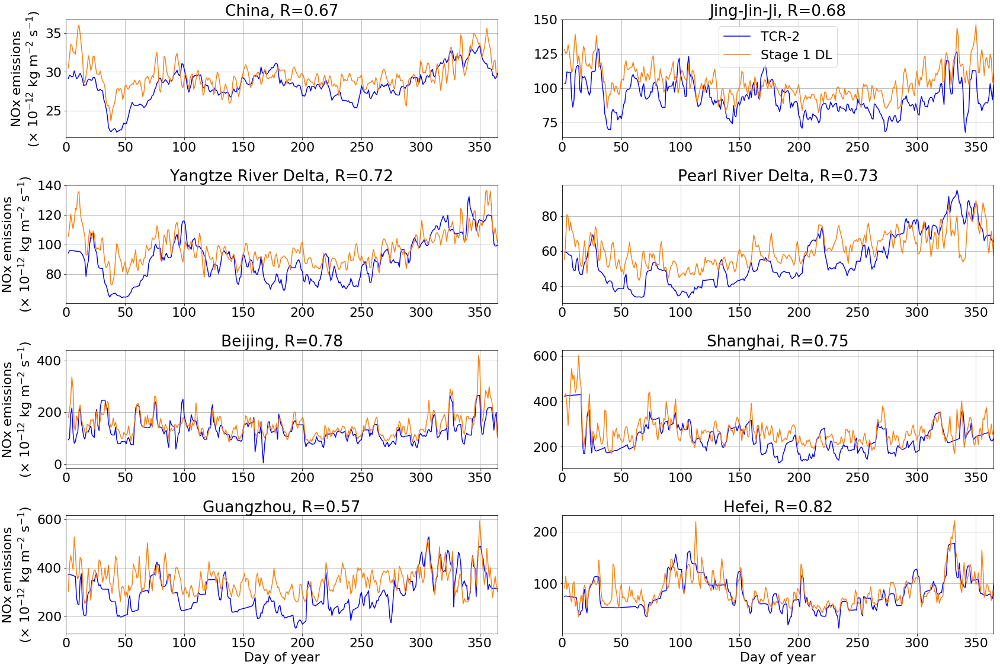

In [242]:
cities = [ 'beijing', 'shanghai', 'guangzhou', 'hefei' ]
_titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Hefei' ]
xx = np.arange(2, 366, 1)

fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

fig = plt.figure(figsize=(25, 16))
curr = 1



mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='#ff7f0e', label='Stage 1 DL')
ax.grid()
plt.title('China, R=%.2f'%r2)
curr += 1
plt.xlim((0, 365))

mask = np.load('JJJ_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='#ff7f0e', label='Stage 1 DL')
ax.grid()
plt.title('Jing-Jin-Ji, R=%.2f'%r2)
curr += 1
plt.xlim((0, 365))

mask = np.load('Yangtze_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='#ff7f0e', label='Stage 1 DL')
ax.grid()
plt.title('Yangtze River Delta, R=%.2f'%r2)
curr += 1
plt.xlim((0, 365))

mask = np.load('Pearl_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 364, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='#ff7f0e', label='Stage 1 DL')
ax.grid()
plt.title('Pearl River Delta, R=%.2f'%r2)
curr += 1
plt.xlim((0, 365))

for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lons) )
    iy = np.argmin( abs(latnow - lats) )

    truthnow = truth[:, iy, ix]
    prednow = pred[:, iy, ix]
    
    r2 = np.corrcoef(truthnow, prednow)[1, 0]
    
    ax = plt.subplot(4, 2, curr)
    ax.plot(xx[:], truthnow[:], 'b-', label='TCR-2')
    ax.plot(xx[:], prednow[:], color='#ff7f0e', label='Stage 1 DL')
    
    ax.grid()
    plt.title(_titles[curr - 5] + ', R=%.2f'%r2)
    
    curr += 1
    plt.xlim((0, 365))

allaxes = fig.get_axes()
allaxes[6].set_xlabel('Day of year')
allaxes[7].set_xlabel('Day of year')

allaxes[0].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[2].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[4].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[6].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
    
    
plt.subplots_adjust(left=0.08, wspace=0.15, hspace=0.4, right=0.95, top=0.95, bottom=0.05)
allaxes[1].legend(loc='upper center')

plt.savefig('p1_ts_comp.png', dpi=400)

(364, 35, 46) (114, 35, 46)


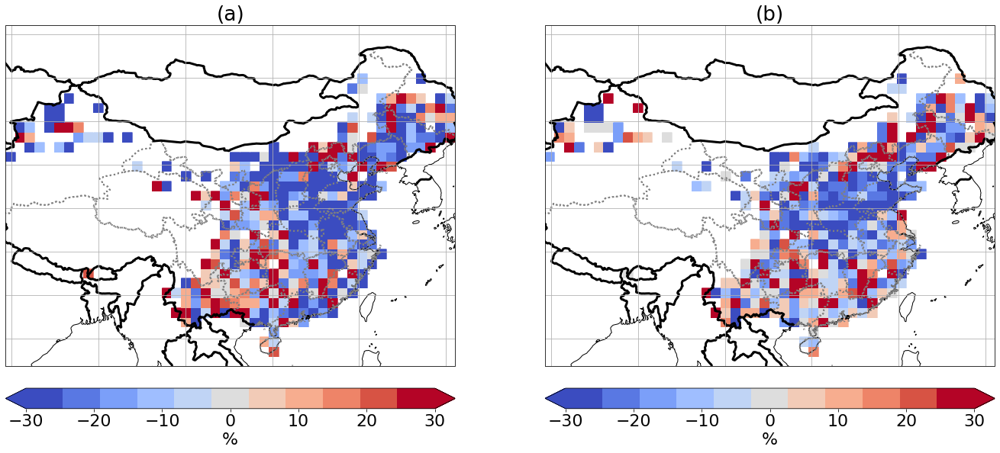

In [74]:
mask1 = np.load('China_mask_final.npy')
# mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_mask_final.npy')
# mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))
pred = pred*mask1[0]

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))
pred2 = pred2*mask2[0]

print(pred.shape, pred2.shape)

# print(dt19[14:24])
# print(dt20[3:13])
# print(dt19[45:55])
# print(dt20[34:44])

# pred[pred < 5] = np.nan
# pred2[pred2 < 5] = np.nan

after19 = np.mean(pred[45:55], axis=0)     # 0 -- 20
before20 = np.mean(pred2[3:13], axis=0)    # -10 -- -20
after20 = np.mean(pred2[34:44], axis=0)  # 10 -- 20


after19[before20 < 10] = np.nan
after20[before20 < 10] = np.nan
before20[before20 < 10] = np.nan


err3 = (after20 - before20)/before20 * 100
err4 = (after20 - after19)/after19 * 100

plt.figure(figsize=(20, 9))

cmap = cm.get_cmap('coolwarm', 11)
cmap.set_bad(color='white', alpha=0.3)

ax = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, err3, cmap=cmap, vmin=-30 , vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('TCR-2 % change compared to Jan--March 2019')
plt.title('(a)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('%')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())


ax = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, err4, cmap=cmap, vmin=-30 , vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('DL % change compared to Jan--March 2019')
plt.title('(b)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('%')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

plt.subplots_adjust(left=0.05, right=0.95, top=0.98, bottom=0.08, hspace=0.1)

plt.savefig('anomaly_map.png', dpi=300)

(364, 35, 46) (114, 35, 46)


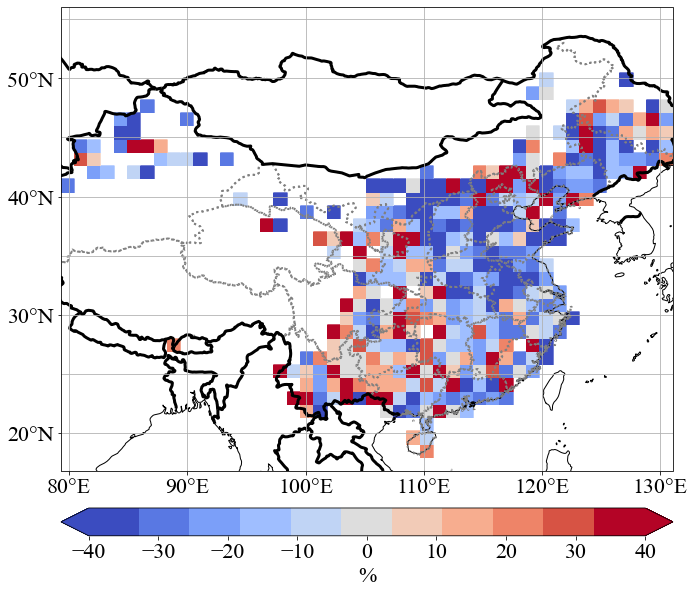

In [39]:
plt.rc('font', family='Times New Roman')
from cartopy.mpl.ticker import LatitudeFormatter, LongitudeFormatter
lon_formatter = LongitudeFormatter()
lat_formatter = LatitudeFormatter()


mask1 = np.load('China_mask_final.npy')
# mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_mask_final.npy')
# mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))
pred = pred*mask1[0]

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))
pred2 = pred2*mask2[0]

print(pred.shape, pred2.shape)

# print(dt19[14:24])
# print(dt20[3:13])
# print(dt19[45:55])
# print(dt20[34:44])

# pred[pred < 5] = np.nan
# pred2[pred2 < 5] = np.nan

after19 = np.mean(pred[45:55], axis=0)     # 0 -- 20
before20 = np.mean(pred2[3:13], axis=0)    # -10 -- -20
after20 = np.mean(pred2[34:44], axis=0)  # 10 -- 20


after19[before20 < 10] = np.nan
after20[before20 < 10] = np.nan
before20[before20 < 10] = np.nan


err3 = (after20 - before20)/before20 * 100
err4 = (after20 - after19)/after19 * 100

plt.figure(figsize=(10, 9))

cmap = cm.get_cmap('coolwarm', 11)
cmap.set_bad(color='white', alpha=0.3)

ax = plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, err3, cmap=cmap, vmin=-40 , vmax=40)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('TCR-2 % change compared to Jan--March 2019')
# plt.title('(a)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines(ls='--')
ax.set_xticks(range(70, 141, 10), crs=ccrs.PlateCarree())
ax.set_yticks(range(0, 61, 10), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
cbar.ax.set_xlabel('%')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())


# ax = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
# cs = ax.pcolormesh(lonb, latb, err4, cmap=cmap, vmin=-30 , vmax=30)
# cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# # plt.title('DL % change compared to Jan--March 2019')
# plt.title('(b)')
# ax.coastlines()
# ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
# ax.add_feature(country_borders, edgecolor='black', lw=3)
# ax.gridlines()
# cbar.ax.set_xlabel('%')
# ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

plt.subplots_adjust(left=0.10, right=0.95, top=1.2, bottom=0.05, hspace=0.1)

plt.savefig('anomaly_map_a.pdf', dpi=300)

(364, 35, 46) (114, 35, 46)
-13.233333658350318 -3.481843670093675


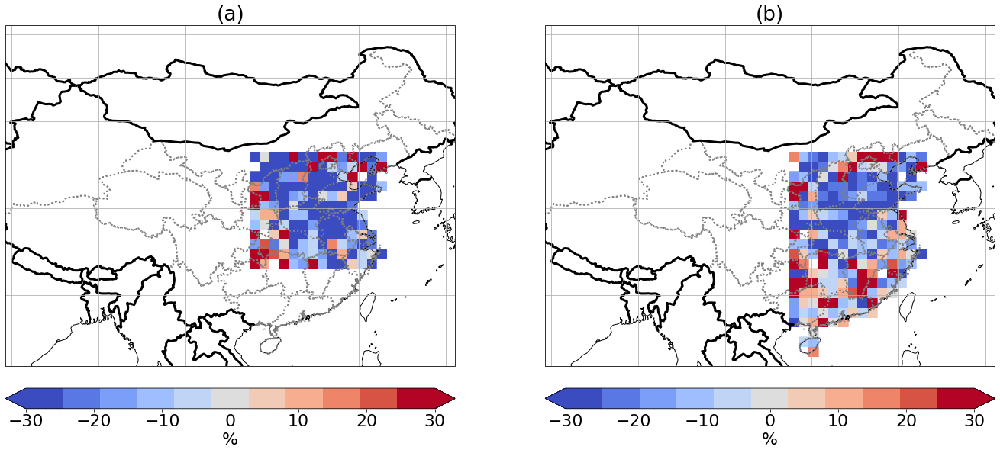

In [119]:
mask1 = np.load('China_mask_final.npy')
# mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_mask_final.npy')
# mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))
pred = pred*mask1[0]

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))
pred2 = pred2*mask2[0]

print(pred.shape, pred2.shape)

# print(dt19[14:24])
# print(dt20[3:13])
# print(dt19[45:55])
# print(dt20[34:44])

# pred[pred < 5] = np.nan
# pred2[pred2 < 5] = np.nan

after19 = np.mean(pred[45:55], axis=0)     # 0 -- 20
before20 = np.mean(pred2[3:13], axis=0)    # -10 -- -20
after20 = np.mean(pred2[34:44], axis=0)  # 10 -- 20


after19[before20 < 10] = np.nan
after20[before20 < 10] = np.nan
before20[before20 < 10] = np.nan


err3 = (after20 - before20)/before20 * 100
err4 = (after20 - after19)/after19 * 100

plt.figure(figsize=(20, 9))

cmap = cm.get_cmap('coolwarm', 11)
cmap.set_bad(color='white', alpha=0.3)

ax = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb[25:40], latb[10:-13], err3[10:-13, 25:40], cmap=cmap, vmin=-30 , vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('TCR-2 % change compared to Jan--March 2019')
plt.title('(a)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('%')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())


ax = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb[25:40], latb[:-13], err4[:-13, 25:40], cmap=cmap, vmin=-30 , vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('DL % change compared to Jan--March 2019')
plt.title('(b)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('%')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

plt.subplots_adjust(left=0.05, right=0.95, top=0.98, bottom=0.08, hspace=0.1)

print(np.nanmean(err3[10:-13, 25:40]), np.nanmean(err4[:-13, 25:40]))

In [18]:


mask1 = np.load('masks/China_mask_final.npy', allow_pickle=True)
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 365, axis=1)

mask2 = np.load('masks/China_mask_final.npy', allow_pickle=True)
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 115, axis=1)

ln = Converter.Lunar2Solar( Lunar(year=2019, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t106/nox_2019_t106_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2019, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time1 = np.array([s.days for s in time])
print(fh.variables['nox'])
t2019 = fh.variables['nox'][:,:,:]
fh.close()

# print(time1.shape, t2019.shape)

ln = Converter.Lunar2Solar( Lunar(year=2020, month=1, day=1, isleap=False) )
ln = datetime.combine( ln.to_date() , datetime.min.time() )

fh = nc.Dataset('t106/nox_2020_t106_China.nc')
time = fh.variables['time'][:]/1440
time = np.array([datetime(2020, 1, 1, 0, 0, 0) + timedelta(s) for s in time])
time = time - ln
time2 = np.array([s.days for s in time])
t2020 = fh.variables['nox'][:]
fh.close()

print(t2019.shape, t2020.shape)
print(mask1.shape, mask2.shape)
print(time1.shape, time2.shape)

pred = t2019*mask1[0]
pred2 = t2020*mask2[0]

print(pred.shape, pred2.shape)


print(time1[49:64])
print(time2[4:11])
print(time2[38:53])

after19 = np.mean(pred[49:64], axis=0)     # 14 -- 28
before20 = np.mean(pred2[4:11], axis=0)    # -20 -- -14 
after20 = np.mean(pred2[38:53], axis=0)  # 14 -- 28

print(np.nanmean(before20), np.nanmean(after20))

err3 = (np.nanmean(after20) - np.nanmean(before20))/np.nanmean(before20) * 100
err4 = (np.nanmean(after20) - np.nanmean(after19))/np.nanmean(after19) * 100

print(np.nanmean(err3), np.nanmean(err4))

mask0 = np.load('masks/China_mask_final.npy', allow_pickle=True)[0]
mask1 = np.load('masks/JJJ_mask.npy', allow_pickle=True)
mask2 = np.load('masks/Yangtze_mask.npy', allow_pickle=True)
mask3 = np.load('masks/Pearl_mask.npy', allow_pickle=True)
print(mask1.shape, mask2.shape, mask3.shape)
mask0[mask0 == 0] = np.nan
mask1[mask1 == 0] = np.nan
mask2[mask2 == 0] = np.nan
mask3[mask3 == 0] = np.nan

print('JJJ, YRD, PRD: ')

print(np.nanmean(before20*mask1), np.nanmean(after20*mask1))
print(np.nanmean(before20*mask2), np.nanmean(after20*mask2))
print(np.nanmean(before20*mask3), np.nanmean(after20*mask3))

err3 = (np.nanmean(after20*mask1) - np.nanmean(before20*mask1))/np.nanmean(before20*mask1) * 100
err4 = (np.nanmean(after20*mask1) - np.nanmean(after19*mask1))/np.nanmean(after19*mask1) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask2) - np.nanmean(before20*mask2))/np.nanmean(before20*mask2) * 100
err4 = (np.nanmean(after20*mask2) - np.nanmean(after19*mask2))/np.nanmean(after19*mask2) * 100
print(np.nanmean(err3), np.nanmean(err4))


err3 = (np.nanmean(after20*mask3) - np.nanmean(before20*mask3))/np.nanmean(before20*mask3) * 100
err4 = (np.nanmean(after20*mask3) - np.nanmean(after19*mask3))/np.nanmean(after19*mask3) * 100
print(np.nanmean(err3), np.nanmean(err4))

<class 'netCDF4._netCDF4.Variable'>
float32 nox(time, lat, lon)
    _FillValue: -999000000.0
    units: kgN/m2/s
    long_name: Surface NOx emissions
unlimited dimensions: 
current shape = (365, 35, 46)
filling on
(365, 35, 46) (115, 35, 46)
(35, 365, 35, 46) (35, 115, 35, 46)
(365,) (115,)
(365, 35, 46) (115, 35, 46)
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28]
[-20 -19 -18 -17 -16 -15 -14]
[14 15 16 17 18 19 20 21 22 23 24 25 26 27 28]
2.9862610474328106e-11 2.2318722332762824e-11
-25.26198487587183 -11.297667954609663
(35, 46) (35, 46) (35, 46)
JJJ, YRD, PRD: 
1.1271050857840014e-10 7.494661096889072e-11
1.035556162708074e-10 7.278002783001676e-11
6.476092894756546e-11 3.824298310464944e-11
-33.50521445233412 -24.080185783995642
-29.718898451929114 1.7794514244541086
-40.94744512449262 0.6676302913213038


(114, 35, 46)


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

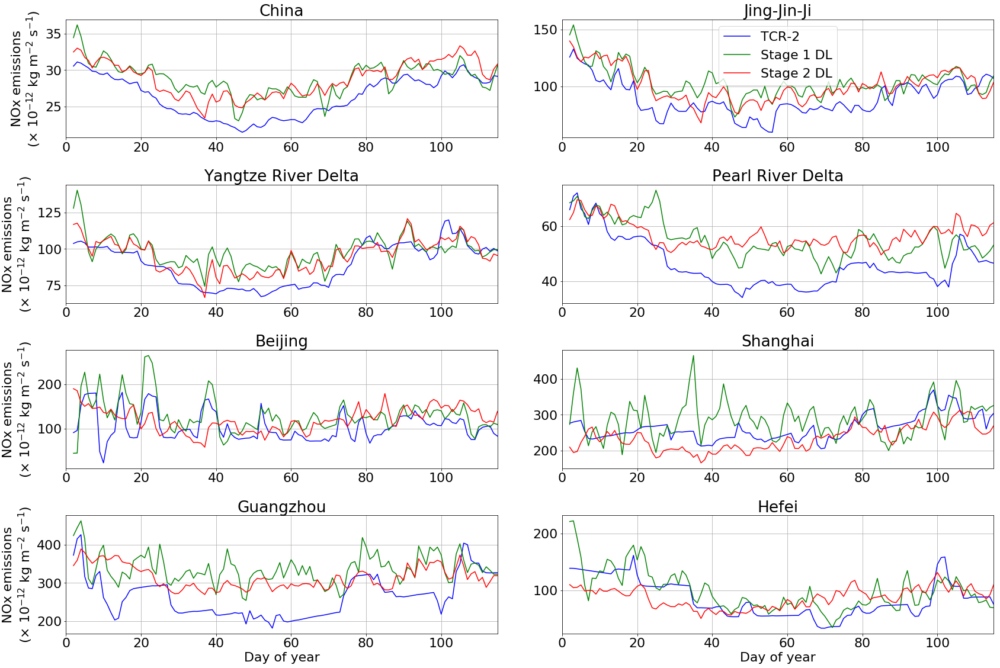

In [270]:
cities = [ 'beijing', 'shanghai', 'guangzhou', 'hefei' ]
_titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Hefei' ]
xx = np.arange(2, 116, 1)

fh = nc.Dataset('nox_2020_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

print(truth.shape)
pred = np.load('Y_p1_pred/Y_pred_2020.npy')
pred = pred.reshape((114, 35, 46))

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))

fig = plt.figure(figsize=(25, 16))
curr = 1

mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 114, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='green', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('China')
curr += 1
plt.xlim((0, 115))

mask = np.load('JJJ_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 114, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='green', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Jing-Jin-Ji')
curr += 1
plt.xlim((0, 115))

mask = np.load('Yangtze_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 114, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='green', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Yangtze River Delta')
curr += 1
plt.xlim((0, 115))

mask = np.load('Pearl_mask.npy')
mask[mask == 0] = np.nan
mask = np.repeat(mask[np.newaxis, :, :], 114, axis=0)
ts1 = np.nanmean(truth*mask, axis=(1, 2))
ts2 = np.nanmean(pred*mask, axis=(1, 2))
ts3 = np.nanmean(pred2*mask, axis=(1, 2))
r2 = np.corrcoef(ts1, ts2)[1, 0]
ax = plt.subplot(4, 2, curr)
ax.plot(xx[:], ts1[:], 'b-', label='TCR-2')
ax.plot(xx[:], ts2[:], color='green', label='Stage 1 DL')
ax.plot(xx[:], ts3[:], 'r-', label='Stage 2 DL')
ax.grid()
plt.title('Pearl River Delta')
curr += 1
plt.xlim((0, 115))

for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lons) )
    iy = np.argmin( abs(latnow - lats) )

    truthnow = truth[:, iy, ix]
    prednow = pred[:, iy, ix]
    pred2now = pred2[:, iy, ix]
    
    r2 = np.corrcoef(truthnow, prednow)[1, 0]
    
    ax = plt.subplot(4, 2, curr)
    ax.plot(xx[:], truthnow[:], 'b-', label='TCR-2')
    ax.plot(xx[:], prednow[:], color='green', label='Stage 1 DL')
    ax.plot(xx[:], pred2now[:], 'r-', label='Stage 2 DL')
    
    ax.grid()
    plt.title(_titles[curr - 5])
    plt.xlim((0, 115))
    curr += 1
    

allaxes = fig.get_axes()
allaxes[6].set_xlabel('Day of year')
allaxes[7].set_xlabel('Day of year')

allaxes[0].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[2].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[4].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
allaxes[6].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg m$^{-2}$ s$^{-1}$)')
    
    
plt.subplots_adjust(left=0.08, wspace=0.15, hspace=0.4, right=0.95, top=0.95, bottom=0.05)
allaxes[1].legend(loc='upper center')

plt.savefig('p2_ts_comp_2020.png', dpi=400)

odict_keys(['lon', 'lat', 'time', 'nox'])


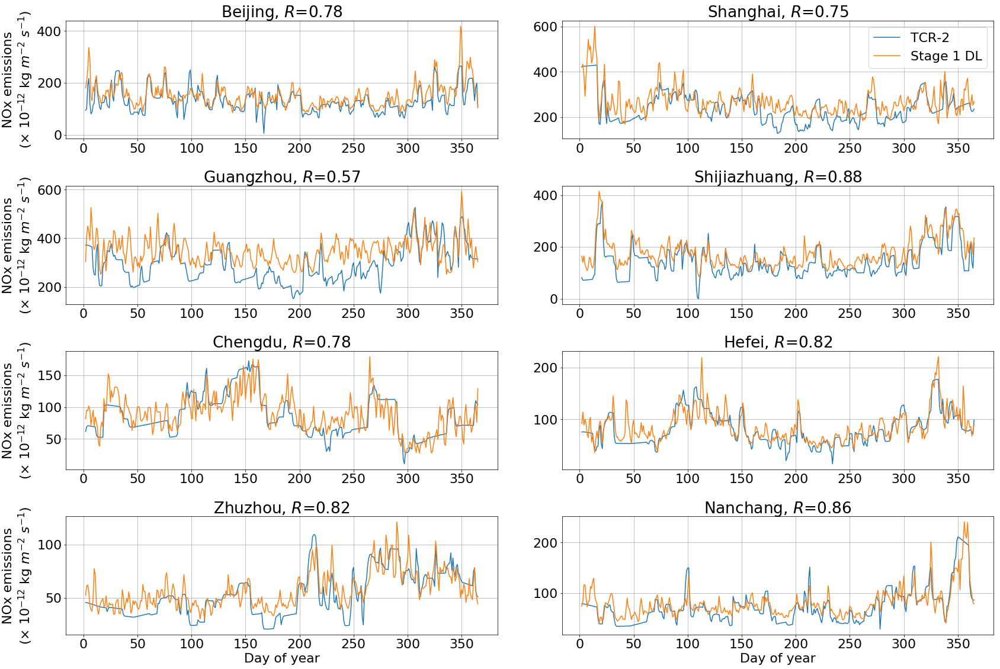

In [83]:
cities = [ 'beijing', 'shanghai', 'guangzhou', 'shijiazhuang', 'chengdu', 
          'hefei', 'zhuzhou', 'nanchang' ]
_titles = [ 'Beijing', 'Shanghai', 'Guangzhou', 'Shijiazhuang', 'Chengdu', 
          'Hefei', 'Zhuzhou', 'Nanchang' ]

fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
print(fh.variables.keys())
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

fig = plt.figure(figsize=(25, 16))
curr = 1
for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lons) )
    iy = np.argmin( abs(latnow - lats) )
    it = doy - 3

    truthnow = truth[:, iy, ix]
    prednow = pred[:, iy, ix]
    
    xx = np.arange(2, 366, 1)

    r2 = np.corrcoef(truthnow, prednow)[1, 0]
    
    ax = plt.subplot(4, 2, curr)
    ax.plot(xx[:], truthnow[:], label='TCR-2')
    ax.plot(xx[:], prednow[:], label='Stage 1 DL')
    
    ax.grid()
    plt.title(_titles[curr - 1] + ', $R$=%.2f'%r2)
    
    curr += 1
    

allaxes = fig.get_axes()
allaxes[6].set_xlabel('Day of year')
allaxes[7].set_xlabel('Day of year')

allaxes[0].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg $m^{-2}$ $s^{-1}$)')
allaxes[2].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg $m^{-2}$ $s^{-1}$)')
allaxes[4].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg $m^{-2}$ $s^{-1}$)')
allaxes[6].set_ylabel('NOx emissions\n'+r'($\times$ $10^{-12}$ kg $m^{-2}$ $s^{-1}$)')
    
    
plt.subplots_adjust(left=0.08, wspace=0.15, hspace=0.4, right=0.95, top=0.95, bottom=0.05)
allaxes[1].legend(loc=1)

plt.savefig('in_situ_p1.png', dpi=400)

In [10]:
from cartopy.feature import ShapelyFeature
from cartopy.io.shapereader import Reader as ShapeReader, natural_earth

# Download the Natural Earth shapefile for country boundaries at 10m resolution
shapefile = natural_earth(category='cultural',
                          resolution='10m',
                          name='admin_1_states_provinces')

country_borders = cfeature.NaturalEarthFeature(
    category='cultural',
    name='‘admin_0_boundary_lines_land',
    scale='10m',
    facecolor='none')

# Sort the geometries in the shapefile into Chinese/Taiwanese or other
country_geos = []
other_land_geos = []
for record in ShapeReader(shapefile).records():
    if record.attributes['admin'] in ['China', 'Taiwan']:
        country_geos.append(record.geometry)
    else:
        other_land_geos.append(record.geometry)
        
# Extract the Chinese province borders
province_geos = [
    record.geometry
    for record in ShapeReader(shapefile).records()
    if record.attributes['admin'] == 'China'
]

projection=ccrs.PlateCarree()
# Define a Cartopy Feature for the province borders, so they can be easily plotted
provinces = ShapelyFeature(province_geos,
                           crs=projection,
                           facecolor='none',
                           edgecolor='black',
                           lw=0.25)


country_borders = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_0_boundary_lines_land',
    scale='50m',
    facecolor='none')


cities = [ 'beijing', 'shanghai', 'guangzhou', 'chengdu', 'shijiazhuang', 
          'hefei', 'zhuzhou', 'taiyuan' ]
df = pd.read_table('China_obs.txt', delimiter=',')
df = df[df['Date'].str.contains("2019")]

fh = nc.Dataset('nox_2019_t106_China.nc')
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()
fh = nc.Dataset('nox_2020_t213_China.nc')
latshr = fh.variables['lat'][:]
lonshr = fh.variables['lon'][:]
fh.close()


def r2_map(tt, pp):
    r2 = np.zeros((tt.shape[1], tt.shape[2]))
    for i in range(tt.shape[1]):
        for j in range(tt.shape[2]):
            tnow = tt[:, i, j]
            pnow = pp[:, i, j]
            r2[i, j] = np.corrcoef(tnow, pnow)[1, 0]
    return r2

lonb = [79.3125] + list((lons[1:] + lons[:-1])/2) + [131.0625]
latb = [16.8225] + list((lats[1:] + lats[:-1])/2) + [56.0745]
lonb = np.array(lonb)
latb = np.array(latb)

print(lonb[0], lonb[-1])
print(latb[0], latb[-1])

79.3125 131.0625
16.8225 56.0745


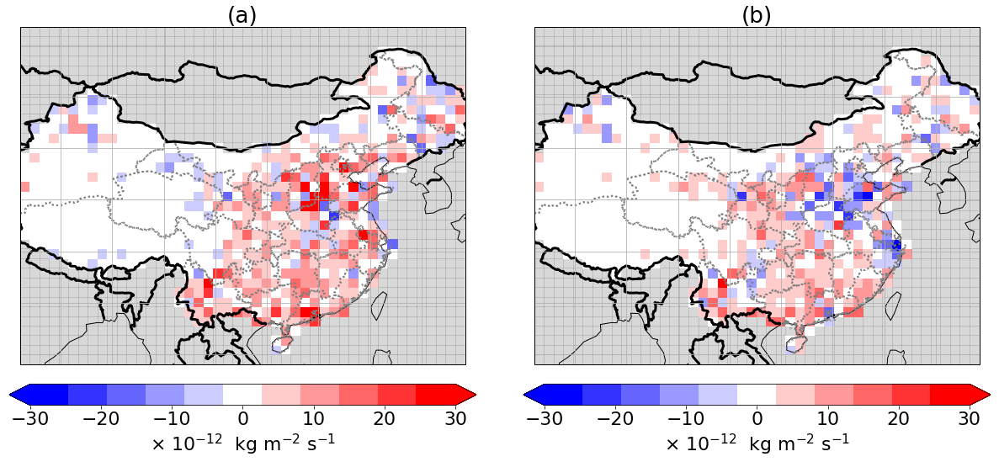

In [10]:
fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
fh.close()

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

truth = np.nanmean(truth, axis=0)
pred = np.nanmean(pred, axis=0)
mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan


pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred2 = pred2.reshape((364, 35, 46))
pred2 = np.nanmean(pred2, axis=0)

plt.figure(figsize=(18, 8))


# ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
# cs = ax.pcolormesh(lonb, latb, pred[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
# cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# # plt.title('Stage 1 DL predicted NOx emission in 2019')
# plt.title('(a)')
# ax.coastlines()
# ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
# ax.add_feature(country_borders, edgecolor='black', lw=3)
# ax.gridlines()
# cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
# ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())






# ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
# cs = ax.pcolormesh(lonb, latb, pred2[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
# cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# # plt.title('Stage 2 DL predicted NOx emission in 2019')
# plt.title('(b)')
# ax.coastlines()
# ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
# ax.add_feature(country_borders, edgecolor='black', lw=3)
# ax.gridlines()
# cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
# ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

cmap = cm.get_cmap('bwr', 11)
cmap.set_bad(color='gray', alpha=0.3)

change = pred2[:, :] - truth[:, :]
change = change*mask
ax = plt.subplot(1, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, change, cmap=cmap, vmin=-30, vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('(a)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

change = pred2[:, :] - pred[:, :]
change = change*mask
ax = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, change, cmap=cmap, vmin=-30, vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('Stage 2 - Stage 1 NOx emission analysis')
plt.title('(b)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.10, wspace=0.1)

plt.savefig('comp_p2.png', dpi=400)

dict_keys(['lon', 'lat', 'time', 'nox'])


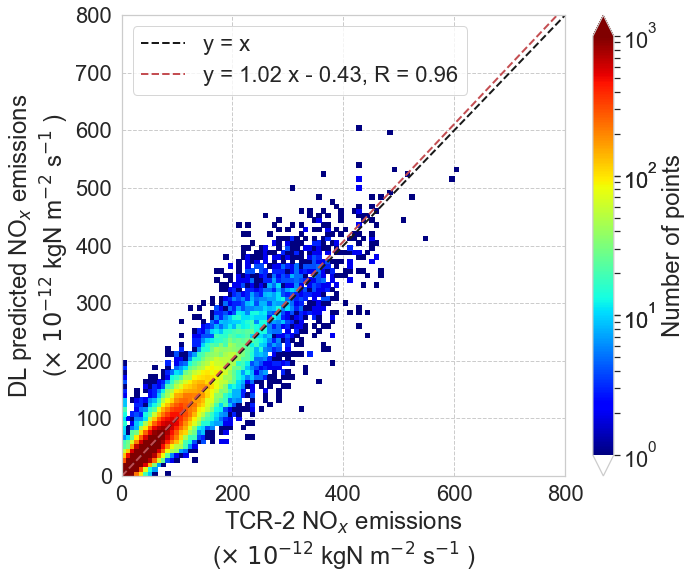

In [16]:
from scipy.stats import linregress
import seaborn as sns
sns.set_theme()
sns.set(font_scale=2)
sns.set_style("whitegrid")


fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 # kgN/m2/s --> nmol/m^2/s
print(fh.variables.keys())
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()


pred = np.load('Y_p1_pred/Y_pred_2019.npy')


my_cmap = plt.cm.jet
my_cmap.set_under('w', 1)


slope, intercept, r_value, p_value, std_err = linregress(truth.flatten(), pred.flatten())

import matplotlib as mpl
xx = np.arange(0, 800)
fig = plt.figure(figsize=(10, 8))
plt.hist2d(truth.flatten(), pred.flatten(), bins=100, norm=mpl.colors.LogNorm(), range=[[0, 800], [0, 800]], cmap=plt.cm.jet, cmin=1, vmax=1e3)
plt.plot(xx, xx, 'k--', lw=2, label='y = x')
plt.plot(xx, slope*xx+intercept, 'r--', lw=2, label=r'y = %.2f x - %.2f, R = %.2f'%(slope, abs(intercept), r_value))

plt.xlim((0, 800))
plt.ylim((0, 800))

plt.colorbar(extend='both', ticks=list(range(11)) + list(range(0, 110, 10)) + list(range(0, 1100, 100)) , label='Number of points')
plt.legend(loc=2)
plt.grid(True, ls='--', alpha=1)
plt.xlabel('TCR-2 NO$_x$ emissions\n' + r'($\times$ $10^{-12}$ kgN m$^{-2}$ s$^{-1}$ )')
plt.ylabel('DL predicted NO$_x$ emissions\n' + r'($\times$ $10^{-12}$ kgN m$^{-2}$ s$^{-1}$ )')

plt.subplots_adjust(right=0.95, left=0.18, bottom=0.15, top=0.95)

plt.savefig('corr_p1.pdf', dpi=400)

In [18]:
dt19 = pd.date_range(datetime(2019, 1, 2), datetime(2019, 12, 31),freq='d') - datetime(2019, 2, 5)
dt20 = pd.date_range(datetime(2020, 1, 2), datetime(2020, 4, 24),freq='d') - datetime(2020, 1, 25)

dt19 = dt19 / np.timedelta64(1, 'D')
dt20 = dt20 / np.timedelta64(1, 'D')

print(dt19[55:75])
print(dt20[3:23])
print(dt20[44:64])

Float64Index([21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0,
              32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0],
             dtype='float64')
Float64Index([-20.0, -19.0, -18.0, -17.0, -16.0, -15.0, -14.0, -13.0, -12.0,
              -11.0, -10.0,  -9.0,  -8.0,  -7.0,  -6.0,  -5.0,  -4.0,  -3.0,
               -2.0,  -1.0],
             dtype='float64')
Float64Index([21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0,
              32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0],
             dtype='float64')


In [8]:
fh = nc.Dataset('nox_2019_t106_China.nc')
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

lonb = [79.3125] + list((lons[1:] + lons[:-1])/2) + [131.0625]
latb = [16.8225] + list((lats[1:] + lats[:-1])/2) + [56.0745]
lonb = np.array(lonb)
latb = np.array(latb)

print(lonb[0], lonb[-1])
print(latb[0], latb[-1])

79.3125 131.0625
16.8225 56.0745


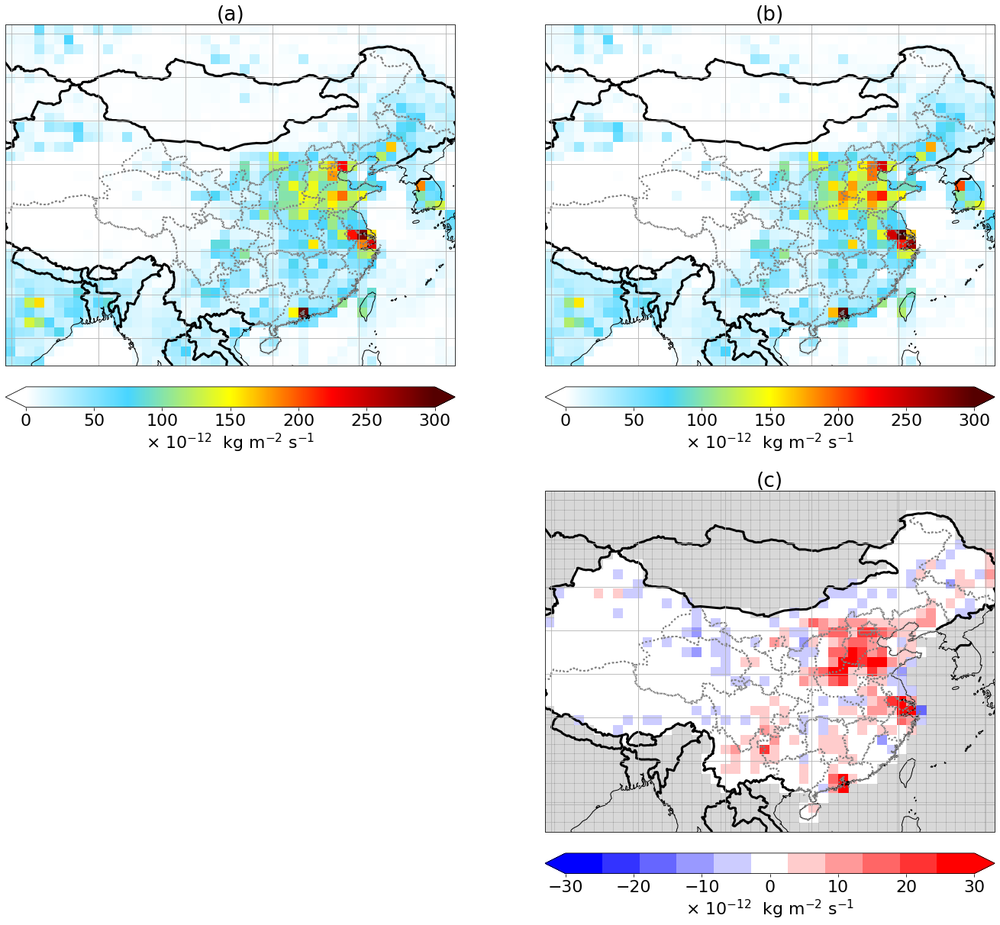

In [12]:
fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
fh.close()

pred = np.load('Y_p1_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

mask = np.load('China_mask_final.npy')[0]
mask[mask == 0] = np.nan
r2map = r2_map(truth, pred)

truth = np.nanmean(truth, axis=0)
pred = np.nanmean(pred, axis=0)

plt.figure(figsize=(20, 18))

ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, truth[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('TCR-2 truth')
plt.title('(a)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, pred[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('DL prediction')
plt.title('(b)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

cmap = cm.get_cmap('bwr', 11)
cmap.set_bad(color='gray', alpha=0.3)
errs = pred[:, :] - truth[:, :]
errs = errs*mask
ax = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, errs, cmap=cmap, vmin=-30, vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
# plt.title('Annual mean bias (Pred - Truth)')
plt.title('(c)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel(r'$\times$ $10^{-12}$  kg m$^{-2}$ s$^{-1}$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

r2map = r2map*mask
r2map[r2map == 0] = np.nan

cmap = cm.get_cmap('plasma', 11)
cmap.set_bad(color='gray', alpha=0.3)
ax = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
cs = ax.pcolormesh(lonb, latb, r2map, cmap=cmap, vmin=0, vmax=0.9)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="max")
# plt.title('$r^2$')
plt.title('(d)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$R$')
ax.set_extent((79.3125, 131.0625, 16.8225, 56.0745), crs=ccrs.PlateCarree())

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.1)

plt.savefig('phase1_eval_map.png', dpi=400)

In [162]:
print(dt19[14])
print(dt20[3])

-20.0
-20.0


In [159]:
print(dt19)
print(dt20)

Float64Index([-34.0, -33.0, -32.0, -31.0, -30.0, -29.0, -28.0, -27.0, -26.0,
              -25.0,
              ...
              320.0, 321.0, 322.0, 323.0, 324.0, 325.0, 326.0, 327.0, 328.0,
              329.0],
             dtype='float64', length=364)
Float64Index([-23.0, -22.0, -21.0, -20.0, -19.0, -18.0, -17.0, -16.0, -15.0,
              -14.0,
              ...
               81.0,  82.0,  83.0,  84.0,  85.0,  86.0,  87.0,  88.0,  89.0,
               90.0],
             dtype='float64', length=114)


(-30, 60)

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

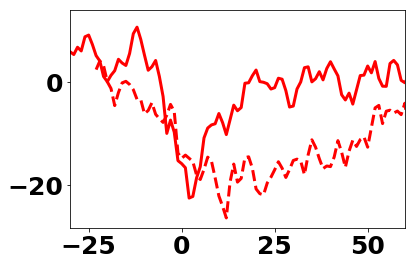

In [166]:
mask1 = np.load('China_mask_final.npy')
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_mask_final.npy')
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred2 = pred2.reshape((364, 35, 46))*1e-12

ts2 = np.nanmean(pred2*mask1[0], axis=(1, 2))
ts2 = (ts2/ts2[14] - 1)*100

plt.plot(dt19, ts2, 'r-', label='DL 2019', lw=3)


pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))*1e-12
ts2 = np.nanmean(pred2*mask2[0], axis=(1, 2))
ts2 = (ts2/ts2[3] - 1)*100

plt.plot(dt20, ts2, 'r--', label='DL 2020', lw=3)
plt.xlim((-30, 60))

China 0


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: find

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


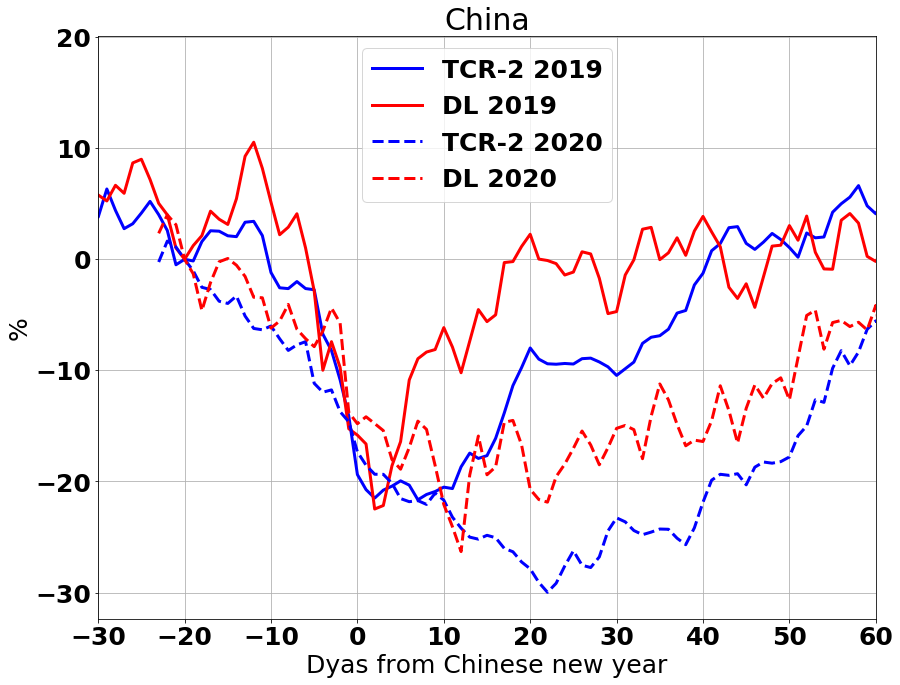

In [163]:
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 25}
# mpl.rc('font', **font)

titles = ['China'] + ['Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 'Beijing', 'Shanghai', 'Guangdong']


def plotts(loc1, loc2, loc3, idx):
#     pred = np.load('Y_p1/Y_2019.npy')
#     pred = pred.reshape((364, 35, 46))

    fh = nc.Dataset('nox_2019_t106_China.nc')
    pred = fh.variables['nox'][1:]*1e12
    fh.close()

    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
    pred2 = pred2.reshape((364, 35, 46))*1e-12


    mask1 = np.load('China_mask_final.npy')
    mask1[mask1 == 0] = np.nan
    mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

    mask2 = np.load('China_mask_final.npy')
    mask2[mask2 == 0] = np.nan
    mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

    ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask1[idx], axis=(1, 2))
    ts1 = (ts1/ts1[14] - 1)*100
    ts2 = (ts2/ts2[14] - 1)*100

    plt.subplot(loc1, loc2, loc3)
    plt.plot(dt19, ts1, 'b-', label='TCR-2 2019', lw=3)
    plt.plot(dt19, ts2, 'r-', label='DL 2019', lw=3)

    pred = np.load('Y_p1/Y_2020.npy')
    pred = pred.reshape((114, 35, 46))
    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
    pred2 = pred2.reshape((114, 35, 46))*1e-12


    ts1 = np.nanmean(pred*mask2[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
    ts1 = (ts1/ts1[3] - 1)*100
    ts2 = (ts2/ts2[3] - 1)*100

    plt.plot(dt20, ts1, 'b--', label='TCR-2 2020', lw=3)
    plt.plot(dt20, ts2, 'r--', label='DL 2020', lw=3)
#     plt.legend()

    plt.grid()
    plt.xlabel('Dyas from Chinese new year')
    plt.ylabel('%')
    print(titles[idx], idx)
    plt.title(titles[idx])
    plt.xlim((-30, 60))
    
plt.figure(figsize=(12, 9))

for i in range(1):
    plotts(1, 1, i+1, i)
    
plt.legend()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('ts_comp_test.png', dpi=200)

# Time series

China 0
Hubei 1
Chongqing 2
Sichuan 3
Anhui 4
Jiangsu 5
Zhejiang 6
Hebei 7
Shandong 8
Beijing 9
Shanghai 10
Guangdong 11


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


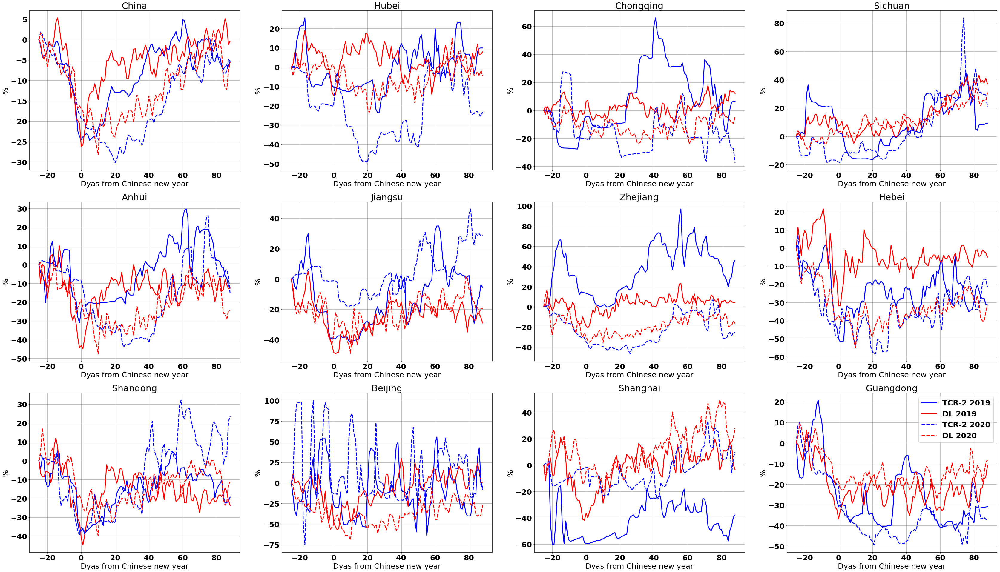

In [143]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 25}
mpl.rc('font', **font)

titles = ['China'] + ['Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 'Beijing', 'Shanghai', 'Guangdong']

plt.figure(figsize=(50, 28))

def plotts(loc1, loc2, loc3, idx):
#     pred = np.load('Y_p1/Y_2019.npy')
#     pred = pred.reshape((364, 35, 46))

    fh = nc.Dataset('nox_2019_t106_China.nc')
    pred = fh.variables['nox'][1:]*1e12
    fh.close()

    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
    pred2 = pred2.reshape((364, 35, 46))*1e-12


    mask1 = np.load('China_masks.npy')
    mask1[mask1 == 0] = np.nan
    mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

    mask2 = np.load('China_masks.npy')
    mask2[mask2 == 0] = np.nan
    mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)
    xx = np.arange(-25, 89, 1)
    ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
    ts2 = np.nanmean(pred2*mask1[idx], axis=(1, 2))[11:125]
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.subplot(loc1, loc2, loc3)
    plt.plot(xx, ts1, 'b-', label='TCR-2 2019', lw=3)
    plt.plot(xx, ts2, 'r-', label='DL 2019', lw=3)

    pred = np.load('Y_p1/Y_2020.npy')
    pred = pred.reshape((114, 35, 46))
    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
    pred2 = pred2.reshape((114, 35, 46))*1e-12


    ts1 = np.nanmean(pred*mask2[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.plot(xx, ts1, 'b--', label='TCR-2 2020', lw=3)
    plt.plot(xx, ts2, 'r--', label='DL 2020', lw=3)
#     plt.legend()

    plt.grid()
    plt.xlabel('Dyas from Chinese new year')
    plt.ylabel('%')
    print(titles[idx], idx)
    plt.title(titles[idx])
    
for i in range(12):
    plotts(3, 4, i+1, i)
    
plt.legend()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('ts_comp_lowdp_tcr2.png', dpi=200)

China 0
Hubei 1
Chongqing 2
Sichuan 3
Anhui 4
Jiangsu 5
Zhejiang 6
Hebei 7
Shandong 8
Beijing 9
Shanghai 10
Guangdong 11


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


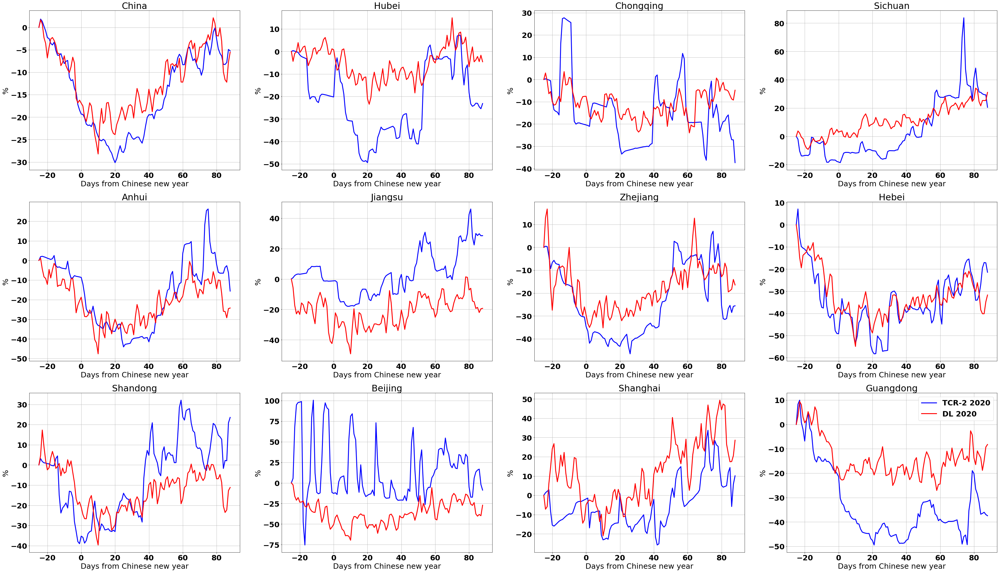

In [6]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 25}
mpl.rc('font', **font)

titles = ['China'] + ['Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 'Beijing', 'Shanghai', 'Guangdong']

plt.figure(figsize=(50, 28))

def plotts(loc1, loc2, loc3, idx):
#     pred = np.load('Y_p1/Y_2019.npy')
#     pred = pred.reshape((364, 35, 46))

    fh = nc.Dataset('nox_2019_t106_China.nc')
    pred = fh.variables['nox'][1:]*1e12
    fh.close()

    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
    pred2 = pred2.reshape((364, 35, 46))*1e-12


    mask1 = np.load('China_masks.npy')
    mask1[mask1 == 0] = np.nan
    mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

    mask2 = np.load('China_masks.npy')
    mask2[mask2 == 0] = np.nan
    mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)
    xx = np.arange(-25, 89, 1)
    ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
    ts2 = np.nanmean(pred2*mask1[idx], axis=(1, 2))[11:125]
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.subplot(loc1, loc2, loc3)
#     plt.plot(xx, ts1, 'b-', label='TCR-2 2019', lw=3)
#     plt.plot(xx, ts2, 'r-', label='DL 2019', lw=3)

    pred = np.load('Y_p1/Y_2020.npy')
    pred = pred.reshape((114, 35, 46))
    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
    pred2 = pred2.reshape((114, 35, 46))*1e-12


    ts1 = np.nanmean(pred*mask2[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.plot(xx, ts1, 'b-', label='TCR-2 2020', lw=3)
    plt.plot(xx, ts2, 'r-', label='DL 2020', lw=3)
#     plt.legend()

    plt.grid()
    plt.xlabel('Days from Chinese new year')
    plt.ylabel('%')
    print(titles[idx], idx)
    plt.title(titles[idx])
    
for i in range(12):
    plotts(3, 4, i+1, i)
    
plt.legend()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('ts_comp_tcr2_DL_2020.png', dpi=200)

China 0


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


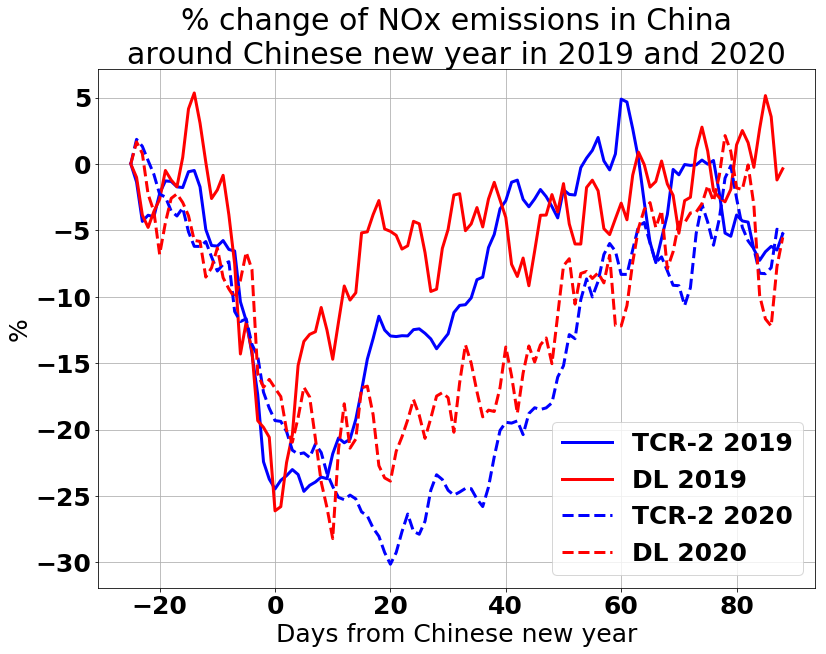

In [191]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 25}
mpl.rc('font', **font)

mask1 = np.load('China_masks.npy')
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_masks.npy')
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

fh = nc.Dataset('nox_2019_t106_China.nc')
tcr2019 = fh.variables['nox'][1:]*1e12
fh.close()

fh = nc.Dataset('nox_2020_t106_China.nc')
tcr2020 = fh.variables['nox'][1:]*1e12
fh.close()

pred1 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred1 = pred1.reshape((364, 35, 46))*1e-12

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))*1e-12

titles = ['China', 'Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 'Beijing', 'Shanghai', 'Guangdong']

plt.figure(figsize=(12, 9))

def plotts(loc1, loc2, loc3, idx):


    xx = np.arange(-25, 89, 1)
    ts1 = np.nanmean(tcr2019*mask1[idx], axis=(1, 2))[11:125]
    ts2 = np.nanmean(pred1*mask1[idx], axis=(1, 2))[11:125]
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.subplot(loc1, loc2, loc3)
    plt.plot(xx, ts1, 'b-', label='TCR-2 2019', lw=3)
    plt.plot(xx, ts2, 'r-', label='DL 2019', lw=3)


    ts1 = np.nanmean(tcr2020*mask2[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.plot(xx, ts1, 'b--', label='TCR-2 2020', lw=3)
    plt.plot(xx, ts2, 'r--', label='DL 2020', lw=3)
#     plt.legend()

    plt.grid()
    plt.xlabel('Days from Chinese new year')
    plt.ylabel('%')
    print(titles[idx], idx)
    plt.title('% change of NOx emissions in China\naround Chinese new year in 2019 and 2020')
    
for i in range(1):
    plotts(1, 1, i+1, i)
    
plt.legend()
plt.subplots_adjust(left=0.12, right=0.95, top=0.90, bottom=0.1)
plt.savefig('ts_comp_lowdp_china.png', dpi=200)

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


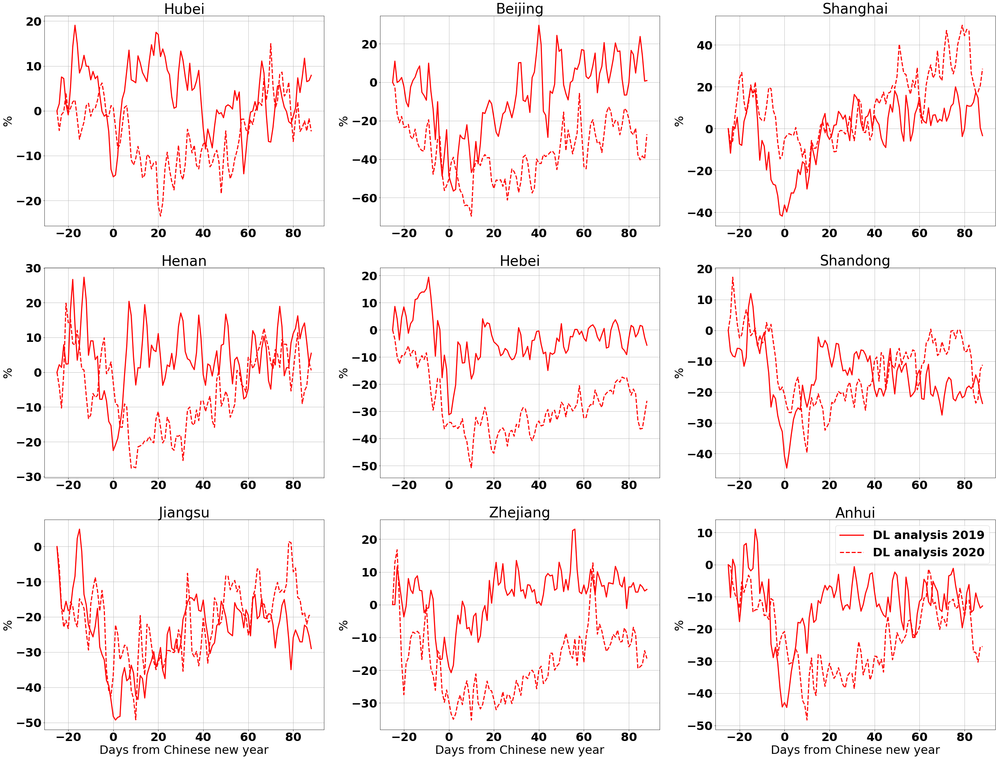

In [190]:
### 9 panel
### 

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 32}
mpl.rc('font', **font)

titles = ['China', 'Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 
          'Beijing', 'Shanghai', 'Guangdong', 'Henan', 'Shanxi', 'Hunan', 'Shaanxi', 'Liaoning', 'Inner Mongolia']
plt.figure(figsize=(40, 30))


pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
pred2 = pred2.reshape((114, 35, 46))*1e-12


mask1 = np.load('China_masks_final.npy')
mask1[mask1 == 0] = np.nan
mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

mask2 = np.load('China_masks_final.npy')
mask2[mask2 == 0] = np.nan
mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)

xx = np.arange(-25, 89, 1)


plt.subplot(3, 3, 1)
idx = 1
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.subplot(3, 3, 2)
idx = 9
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.subplot(3, 3, 3)
idx = 10
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])




plt.subplot(3, 3, 4)
idx = 12
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.subplot(3, 3, 5)
idx = 7
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.subplot(3, 3, 6)
idx = 8
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
# plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])




plt.subplot(3, 3, 7)
idx = 5
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.subplot(3, 3, 8)
idx = 6
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])



plt.subplot(3, 3, 9)
idx = 4
ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
ts1 = (ts1/ts1[0] - 1)*100
ts2 = (ts2/ts2[0] - 1)*100
plt.plot(xx, ts1, 'r-', label='DL analysis 2019', lw=3)
plt.plot(xx, ts2, 'r--', label='DL analysis 2020', lw=3)
plt.grid()
plt.xlabel('Days from Chinese new year')
plt.ylabel('%')
plt.title(titles[idx])


plt.legend()


plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('ts_comp_9panel.png', dpi=200)

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


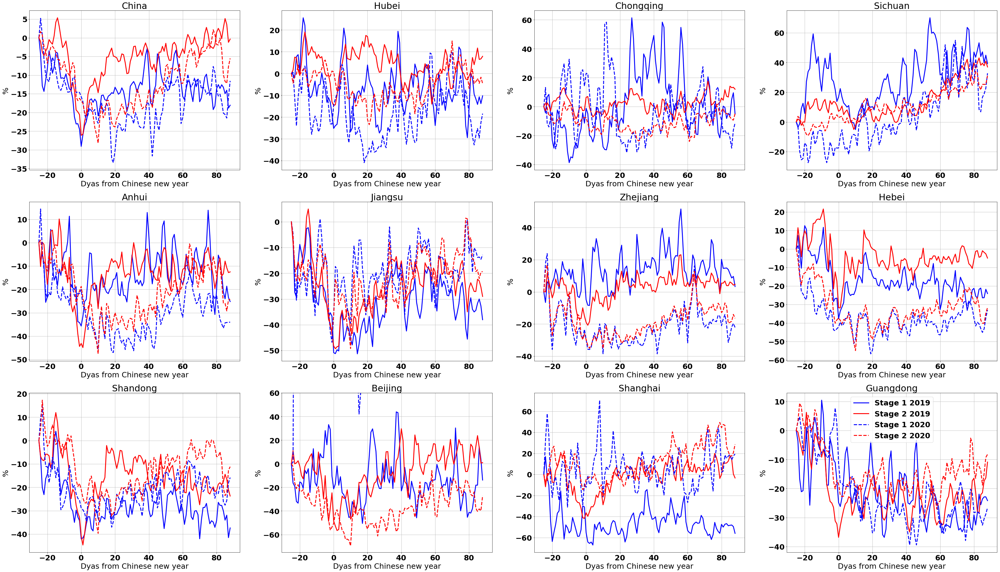

In [136]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 25}
mpl.rc('font', **font)

titles = ['China'] + ['Hubei', 'Chongqing', 'Sichuan', 'Anhui', 'Jiangsu', 'Zhejiang', 'Hebei', 'Shandong', 'Beijing', 'Shanghai', 'Guangdong']

plt.figure(figsize=(50, 28))

def plotts(loc1, loc2, loc3, idx):
    pred = np.load('Y_p1_pred/Y_pred_2019.npy')
    pred = pred.reshape((364, 35, 46))

    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
    pred2 = pred2.reshape((364, 35, 46))*1e-12


    mask1 = np.load('China_masks.npy')
    mask1[mask1 == 0] = np.nan
    mask1 = np.repeat(mask1[:, np.newaxis, :, :], 364, axis=1)

    mask2 = np.load('China_masks.npy')
    mask2[mask2 == 0] = np.nan
    mask2 = np.repeat(mask2[:, np.newaxis, :, :], 114, axis=1)
    xx = np.arange(-25, 89, 1)
    ts1 = np.nanmean(pred*mask1[idx], axis=(1, 2))[11:125]
    ts2 = np.nanmean(pred2*mask1[idx], axis=(1, 2))[11:125]
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.subplot(loc1, loc2, loc3)
    plt.plot(xx, ts1, 'b-', label='Stage 1 2019', lw=3)
    plt.plot(xx, ts2, 'r-', label='Stage 2 2019', lw=3)

    pred = np.load('Y_p1_pred/Y_pred_2020.npy')
    pred = pred.reshape((114, 35, 46))
    pred2 = np.load('Y_p2_filled_pred_after/Y_pred_2020.npy')
    pred2 = pred2.reshape((114, 35, 46))*1e-12


    ts1 = np.nanmean(pred*mask2[idx], axis=(1, 2))
    ts2 = np.nanmean(pred2*mask2[idx], axis=(1, 2))
    ts1 = (ts1/ts1[0] - 1)*100
    ts2 = (ts2/ts2[0] - 1)*100

    plt.plot(xx, ts1, 'b--', label='Stage 1 2020', lw=3)
    plt.plot(xx, ts2, 'r--', label='Stage 2 2020', lw=3)
#     plt.legend()

    plt.grid()
    plt.xlabel('Dyas from Chinese new year')
    plt.ylabel('%')
    plt.title(titles[idx])
    
for i in range(12):
    plotts(3, 4, i+1, i)

plt.legend()
plt.subplot(3, 4, 10)
plt.ylim((-75, 60))


plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('ts_comp_lowdp.png', dpi=200)

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\numpy\lib\function_base.py:2400: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\numpy\lib\function_base.py:2401: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


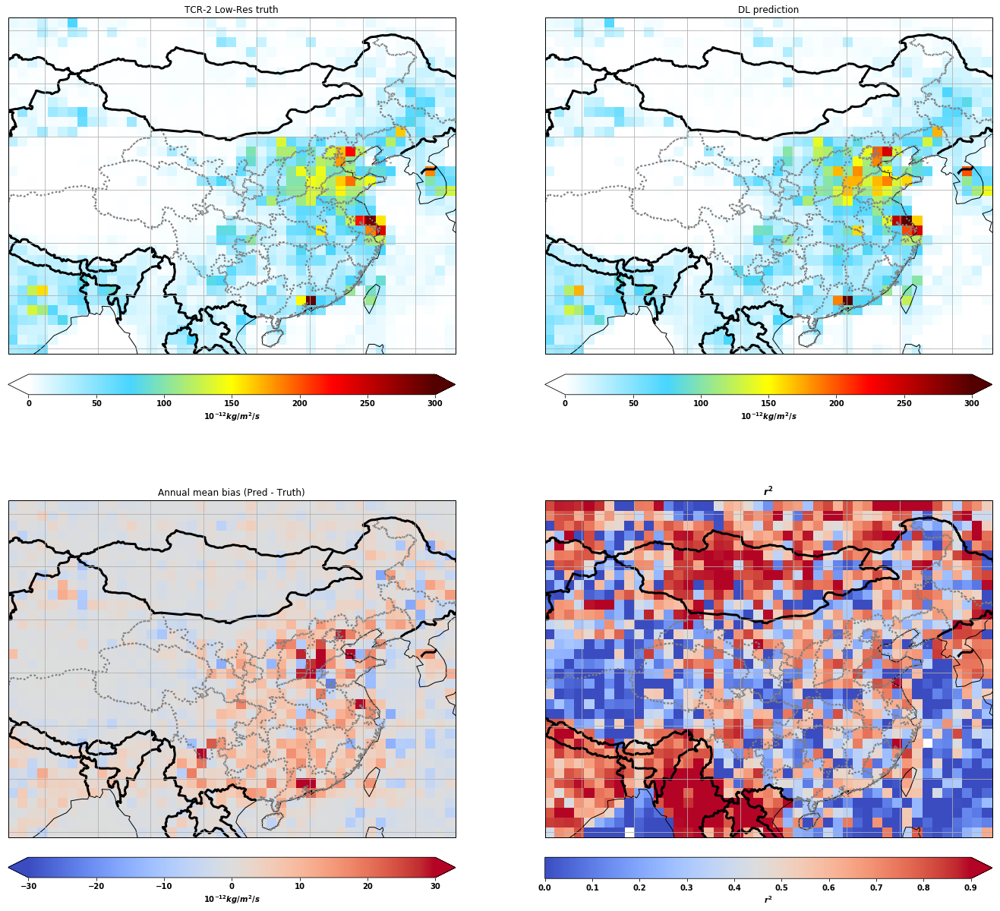

In [7]:
fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
fh.close()

pred = np.load('Y_p2_filled_pred_after/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))


r2map = r2_map(truth, pred)

truth = np.nanmean(truth, axis=0)
pred = np.nanmean(pred, axis=0)

plt.figure(figsize=(20, 18))

ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, truth[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('TCR-2 Low-Res truth')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')


ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, pred[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('DL prediction')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')

ax = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, pred[:, :] - truth[:, :], cmap=cm.coolwarm, vmin=-30, vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('Annual mean bias (Pred - Truth)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')

ax = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, r2map, cmap=cm.coolwarm, vmin=0, vmax=0.9)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="max")
plt.title('$r^2$')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$r^{2}$')

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

# plt.savefig('comp_p2_afterTF.png', dpi=400)

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\numpy\lib\function_base.py:2400: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\numpy\lib\function_base.py:2401: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


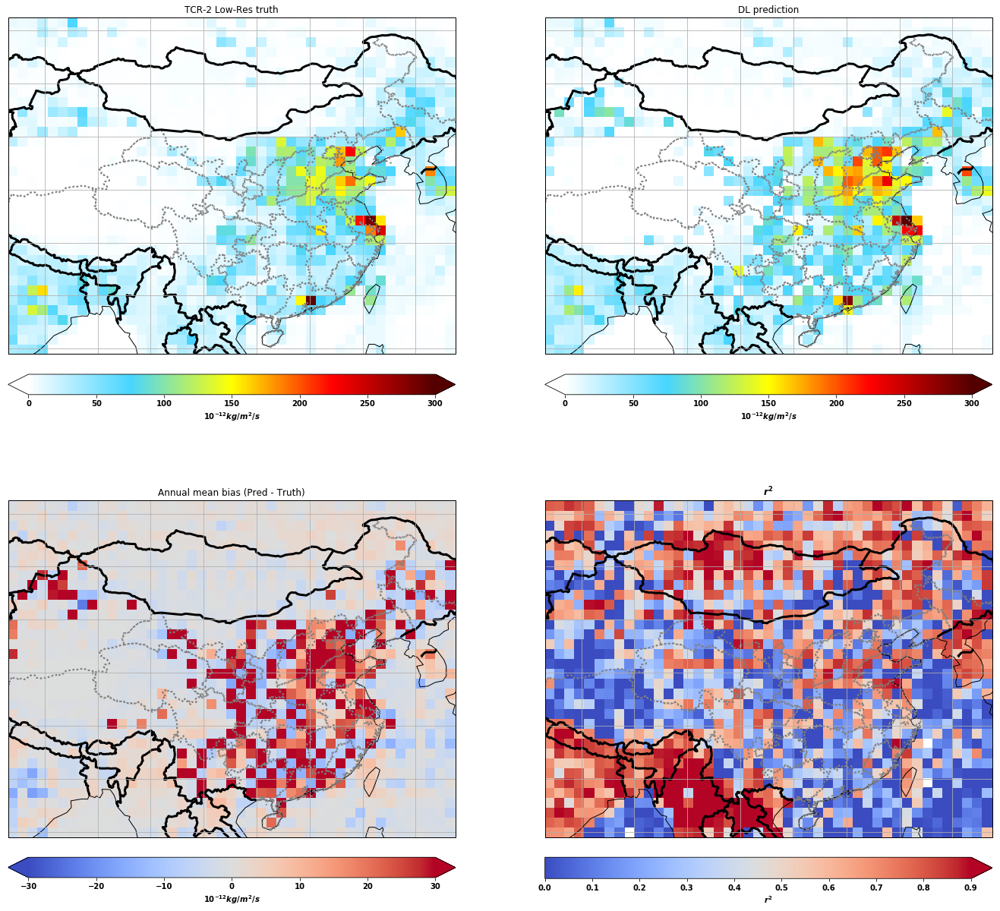

In [8]:
fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 
fh.close()

pred = np.load('Y_p2_filled_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))


r2map = r2_map(truth, pred)

truth = np.nanmean(truth, axis=0)
pred = np.nanmean(pred, axis=0)

plt.figure(figsize=(20, 18))

ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, truth[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('TCR-2 Low-Res truth')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')


ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, pred[:, :], cmap=WhGrYlRd, vmin=0, vmax=300)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('DL prediction')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')

ax = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, pred[:, :] - truth[:, :], cmap=cm.coolwarm, vmin=-30, vmax=30)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="both")
plt.title('Annual mean bias (Pred - Truth)')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$10^{-12}  kg/m^{2}/s$')

ax = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
cs = ax.pcolor(lons, lats, r2map, cmap=cm.coolwarm, vmin=0, vmax=0.9)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.05, extend="max")
plt.title('$r^2$')
ax.coastlines()
ax.add_feature(provinces, linestyle=':', edgecolor='gray', lw=2)
ax.add_feature(country_borders, edgecolor='black', lw=3)
ax.gridlines()
cbar.ax.set_xlabel('$r^{2}$')

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)

plt.savefig('comp_p2_beforeTF.png', dpi=400)

## Stage 2

In [92]:
fh = nc.Dataset('nox_2019_t106_China.nc')
truth = fh.variables['nox'][1:]*1e12 # kgN/m2/s --> nmol/m^2/s
print(fh.variables.keys())
lats = fh.variables['lat'][:]
lons = fh.variables['lon'][:]
fh.close()

pred = np.load('Y_p2_pred/Y_pred_2019.npy')
pred = pred.reshape((364, 35, 46))

print(truth.shape)

cities = [ 'beijing', 'shanghai', 'guangzhou', 'chengdu', 'shijiazhuang', 
          'hefei', 'zhuzhou', 'taiyuan' ]


df = pd.read_table('China_obs.txt', delimiter=',')
df = df[df['Date'].str.contains("2019")]


cities = [ 'beijing', 'shanghai', 'guangzhou', 'chengdu', 'shijiazhuang', 
          'hefei', 'zhuzhou', 'taiyuan' ]

# lons = np.array([81, 82.125, 83.25, 84.375, 85.5, 86.625, 87.75, 88.875, 90, 
#     91.125, 92.25, 93.375, 94.5, 95.625, 96.75, 97.875, 99, 100.125, 101.25, 
#     102.375, 103.5, 104.625, 105.75, 106.875, 108, 109.125, 110.25, 111.375, 
#     112.5, 113.625, 114.75, 115.875, 117, 118.125, 119.25, 120.375, 121.5, 
#     122.625, 123.75, 124.875, 126, 127.125, 128.25, 129.375])
# lats = np.array([ 18.505, 19.626, 20.748, 21.869, 22.991, 24.112, 25.234, 
#     26.355, 27.476, 28.598, 29.719, 30.841, 31.962, 33.084, 34.205, 35.327, 
#     36.448, 37.57, 38.691, 39.813, 40.934, 42.056, 43.177, 44.299, 45.42, 
#     46.542, 47.663, 48.785, 49.906, 51.028, 52.149, 53.271, 54.392])

fh = nc.Dataset('nox_2020_t213_China.nc')
latshr = fh.variables['lat'][:]
lonshr = fh.variables['lon'][:]
fh.close()



print(truth.shape)

truth = np.mean(truth, axis=(0))
pred = np.mean(pred, axis=(0))

odict_keys(['lon', 'lat', 'time', 'nox'])
(364, 35, 46)
(364, 35, 46)


(12, 35, 46)


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


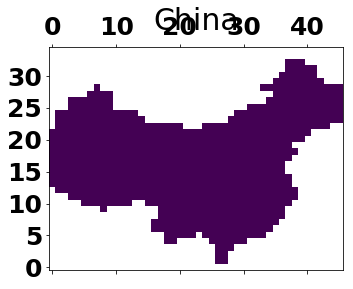

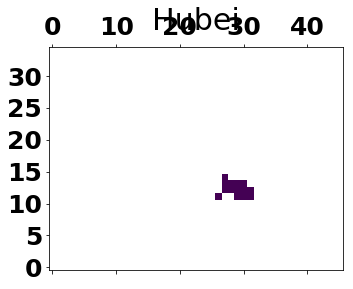

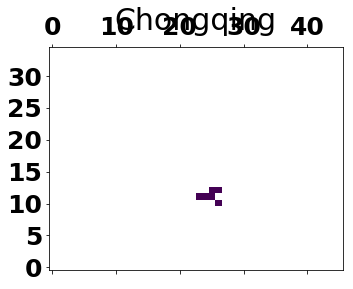

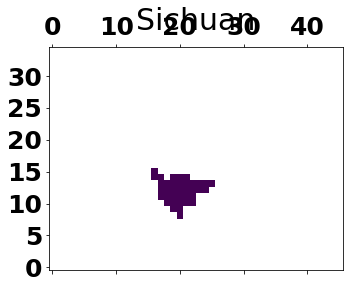

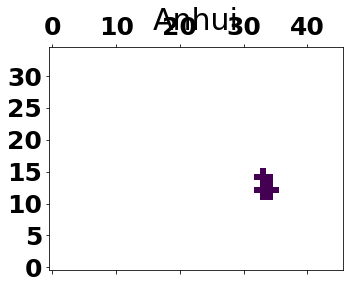

...

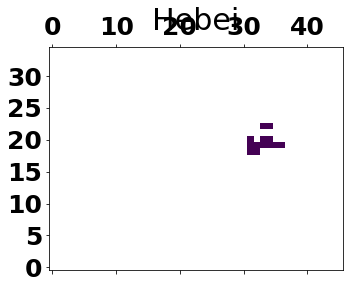

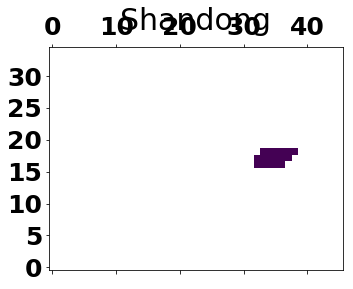

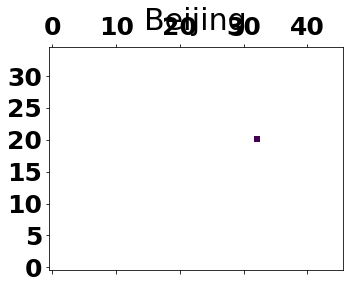

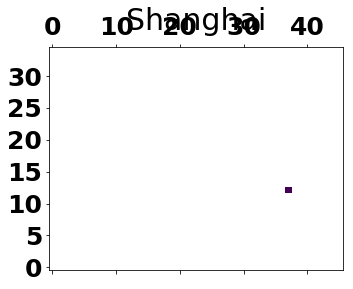

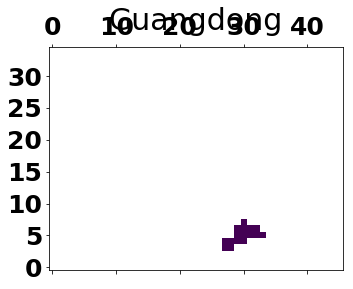

In [148]:
mask1 = np.load('China_masks.npy')
mask1[mask1 == 0] = np.nan
print(mask1.shape)
for i in range(12):
    plt.matshow(mask1[i], origin='low')
    plt.title(titles[i])

### High-res test

1.0877349078785845
(136, 68, 91) (136, 68, 91)


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in true_divide


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


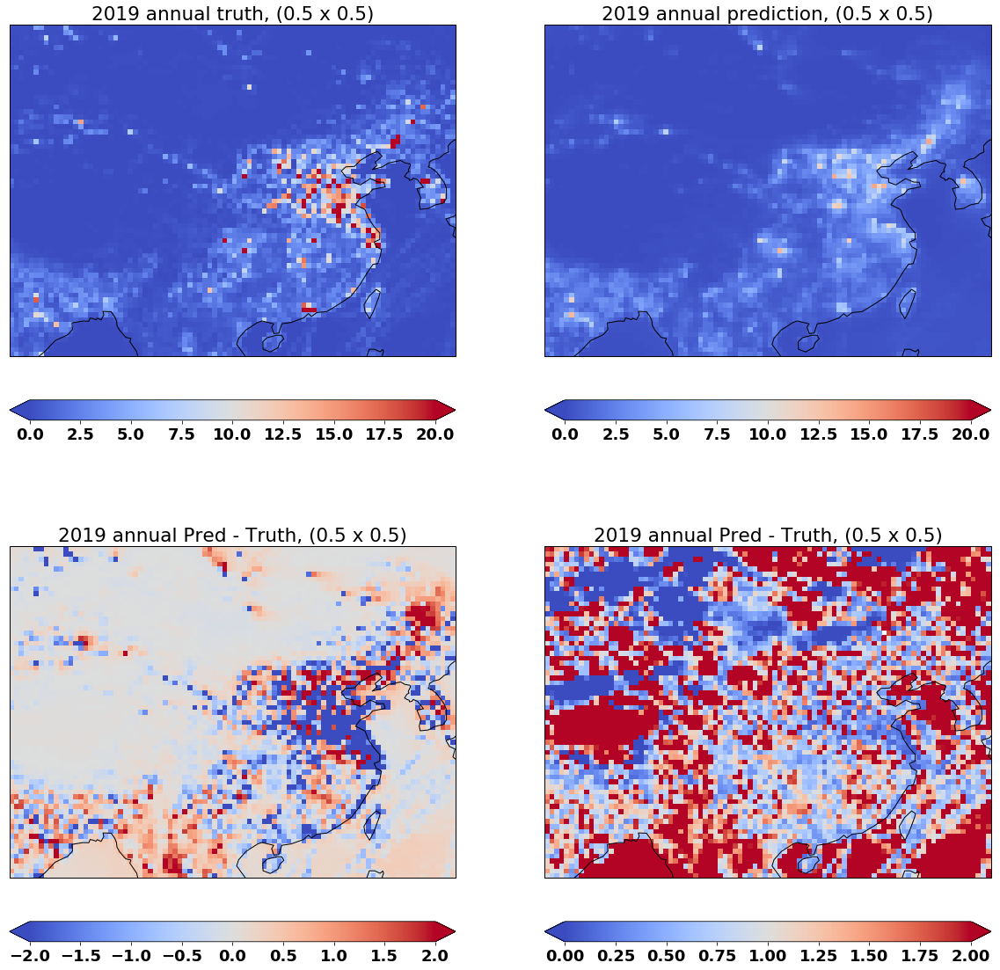

In [327]:
truth_hr = np.load('Y_HR/Y_2019.npy')
truth_hr = truth_hr.reshape((136, 68, 91))

pred_hr = np.load('Y_HR_pred_stage1/Y_2019_pred_HR_stage1.npy')
pred_hr = pred_hr.reshape((136, 68, 91))

indnow=0

print(truth_hr.shape, pred_hr.shape)

plt.figure(figsize=(20, 20))

ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=20)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual truth, (0.5 x 0.5)')
ax.coastlines()


ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=20)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual prediction, (0.5 x 0.5)')
ax.coastlines()

ax = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :] - truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=-2, vmax=2)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual Pred - Truth, (0.5 x 0.5)')
ax.coastlines()

ax = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :] / truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=2)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual Pred - Truth, (0.5 x 0.5)')
ax.coastlines()

Text(0,0.5,'DL predicted HR NOx flux')

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


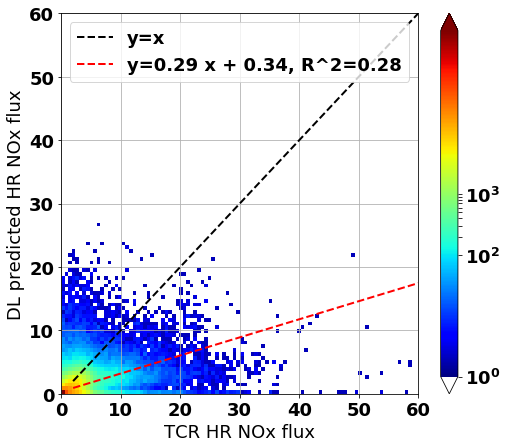

In [303]:
from scipy.stats import linregress

my_cmap = plt.cm.jet
my_cmap.set_under('w', 1)


slope, intercept, r_value, p_value, std_err = linregress(truth_hr.flatten(), pred_hr.flatten())

fig = plt.figure(figsize=(8, 7))
info = plt.hist2d(truth_hr.flatten(), pred_hr.flatten(), bins=100, norm=mpl.colors.LogNorm(), range=[[0, 60], [0, 60]], cmap=plt.cm.jet)
plt.plot(xx, xx, 'k--', lw=2, label='y=x')
plt.plot(xx, slope*xx+intercept, 'r--', lw=2, label='y=%.2f x + %.2f, R^2=%.2f'%(slope, intercept, r_value**2))

plt.xlim((0, 60))
plt.ylim((0, 60))

plt.colorbar(extend='both', ticks=[1, 0] + list(range(0, 1100, 100)) )
plt.legend()
plt.grid()
plt.xlabel('TCR HR NOx flux')
plt.ylabel('DL predicted HR NOx flux')

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


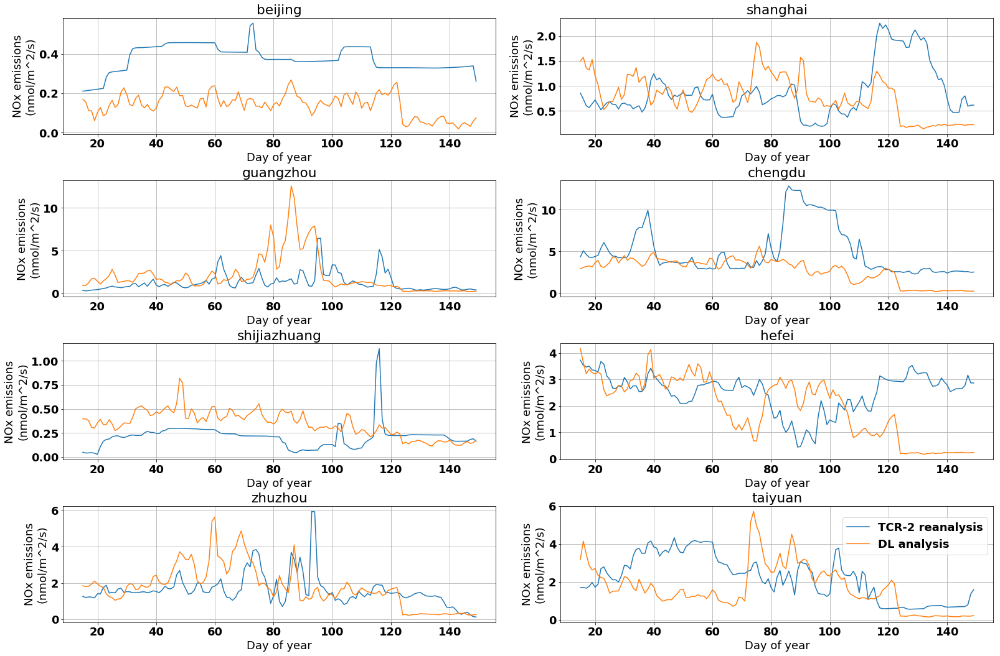

In [304]:
plt.figure(figsize=(25, 15))
curr = 1
for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lon) )
    iy = np.argmin( abs(latnow - lat) )
    it = doy - 3

    truthnow = truth_hr[:, iy, ix]
    prednow = pred_hr[:, iy, ix]
    
    xx = np.arange(15, 151, 1)

    ax = plt.subplot(4, 2, curr)
    ax.plot(xx[:-1], truthnow[:-1], label='TCR-2 reanalysis')
    ax.plot(xx[:-1], prednow[:-1], label='DL analysis')
    
    ax.grid()
    plt.ylabel('NOx emissions\n(nmol/m^2/s)')
    plt.xlabel('Day of year')
    plt.title(cc)
    
    curr += 1
    

plt.subplots_adjust(left=0.05, wspace=0.15, hspace=0.4, right=0.88, top=0.95, bottom=0.05)
ax.legend(bbox_to_anchor=(1.00, 0.95))

In [334]:
truth_hr = np.load('Y_HR/Y_2019.npy')
truth_hr = truth_hr.reshape((136, 68, 91))

pred_hr = np.load('Y_HR_pred_stage1/Y_2019_pred_HR_stage1.npy')
pred_hr = pred_hr.reshape((136, 68, 91))


mask = np.load('China_urban.npy')

tu = truth_hr[:, np.where(mask > 0)[0], np.where(mask > 0)[1]]
pu = pred_hr[:, np.where(mask > 0)[0], np.where(mask > 0)[1]]

tr = truth_hr[:, np.where(mask < 1)[0], np.where(mask < 1)[1]]
pr = pred_hr[:, np.where(mask < 1)[0], np.where(mask < 1)[1]]
tu = tu.flatten()
tr = tr.flatten()
pu = pu.flatten()
pr = pr.flatten()


Text(0,0.5,'DL predicted HR NOx flux')

C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


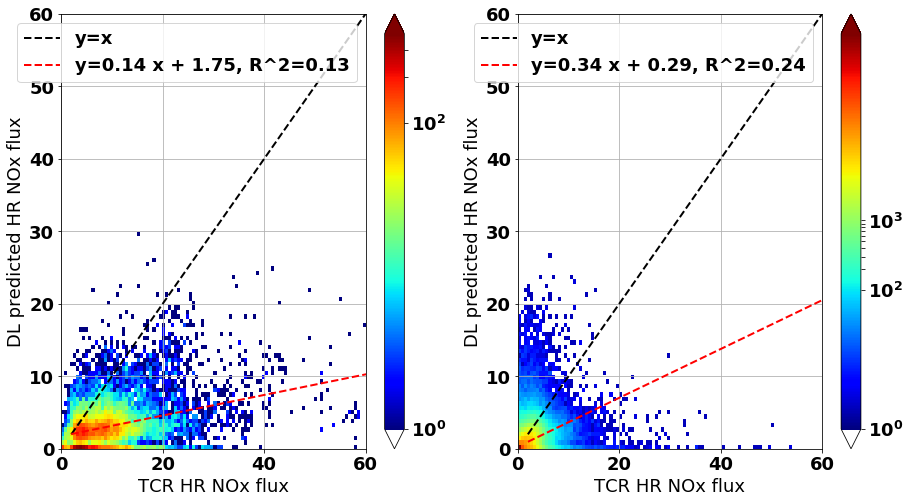

In [339]:
from scipy.stats import linregress

my_cmap = plt.cm.jet
my_cmap.set_under('w', 1)

xx = np.arange(2, 366, 1)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
slope, intercept, r_value, p_value, std_err = linregress(tu, pu)
info = plt.hist2d(tu, pu, bins=100, norm=mpl.colors.LogNorm(), range=[[0, 60], [0, 60]], cmap=plt.cm.jet)
plt.plot(xx, xx, 'k--', lw=2, label='y=x')
plt.plot(xx, slope*xx+intercept, 'r--', lw=2, label='y=%.2f x + %.2f, R^2=%.2f'%(slope, intercept, r_value**2))

plt.xlim((0, 60))
plt.ylim((0, 60))

plt.colorbar(extend='both', ticks=[1, 0] + list(range(0, 1100, 100)) )
plt.legend()
plt.grid()
plt.xlabel('TCR HR NOx flux')
plt.ylabel('DL predicted HR NOx flux')




plt.subplot(1, 2, 2)
slope, intercept, r_value, p_value, std_err = linregress(tr, pr)
info = plt.hist2d(tr, pr, bins=100, norm=mpl.colors.LogNorm(), range=[[0, 60], [0, 60]], cmap=plt.cm.jet)
plt.plot(xx, xx, 'k--', lw=2, label='y=x')
plt.plot(xx, slope*xx+intercept, 'r--', lw=2, label='y=%.2f x + %.2f, R^2=%.2f'%(slope, intercept, r_value**2))

plt.xlim((0, 60))
plt.ylim((0, 60))

plt.colorbar(extend='both', ticks=[1, 0] + list(range(0, 1100, 100)) )
plt.legend()
plt.grid()
plt.xlabel('TCR HR NOx flux')
plt.ylabel('DL predicted HR NOx flux')

### Stage 2

1.0877349078785845
(136, 68, 91) (136, 68, 91)


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in true_divide


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


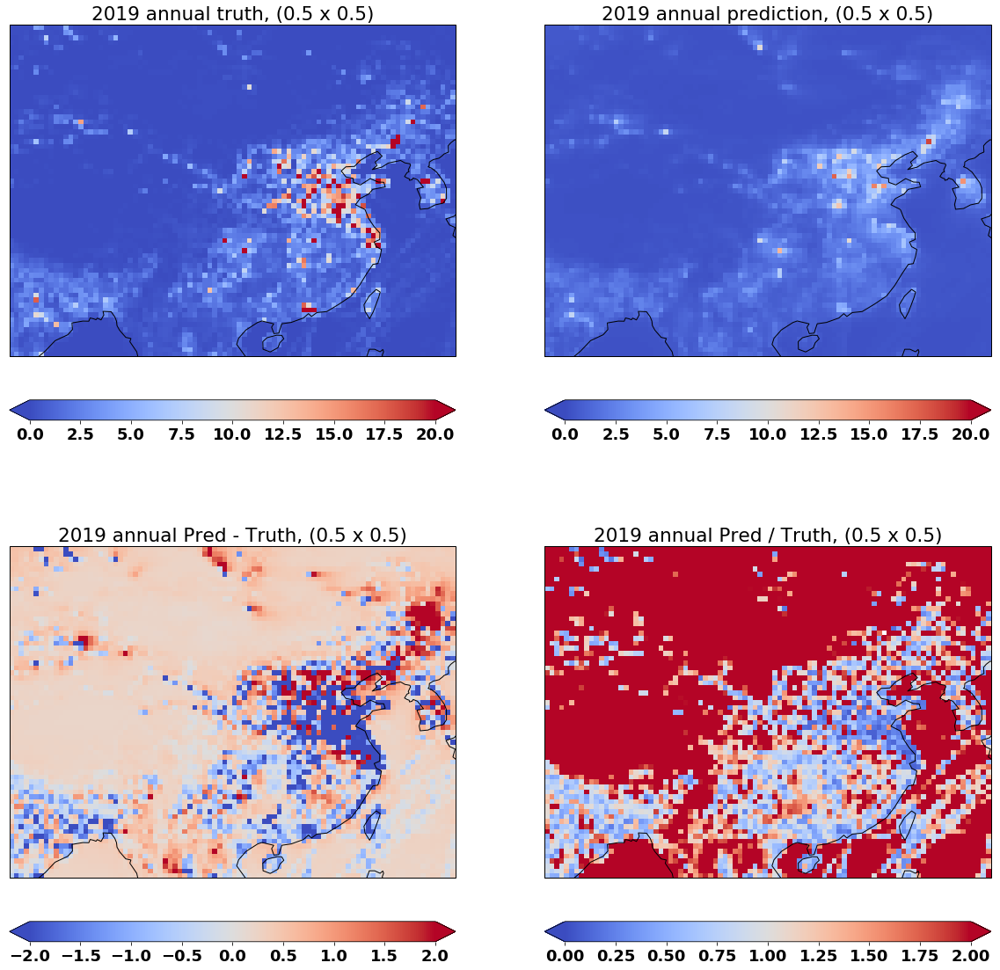

In [323]:
truth_hr = np.load('Y_HR/Y_2019.npy')
truth_hr = truth_hr.reshape((136, 68, 91))
print(np.mean(truth_hr))

pred_hr = np.load('Y_HR_pred_stage1/Y_2019_pred_HR_stage2.npy')
pred_hr = pred_hr.reshape((136, 68, 91))/1e3

indnow=0

print(truth_hr.shape, pred_hr.shape)

plt.figure(figsize=(20, 20))

ax = plt.subplot(2, 2, 1, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=20)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual truth, (0.5 x 0.5)')
ax.coastlines()


ax = plt.subplot(2, 2, 2, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=20)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual prediction, (0.5 x 0.5)')
ax.coastlines()

ax = plt.subplot(2, 2, 3, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :] - truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=-2, vmax=2)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual Pred - Truth, (0.5 x 0.5)')
ax.coastlines()

ax = plt.subplot(2, 2, 4, projection=ccrs.PlateCarree())
cs = ax.pcolor(lonshr, latshr, pred_hr[indnow, :, :] / truth_hr[indnow, :, :], cmap=cm.coolwarm, vmin=0, vmax=2)
cbar = plt.colorbar(cs, orientation="horizontal",fraction=0.08, pad=0.1, extend="both")
plt.title('2019 annual Pred / Truth, (0.5 x 0.5)')
ax.coastlines()

In [50]:
from scipy.stats import linregress

my_cmap = plt.cm.jet
my_cmap.set_under('w', 1)


slope, intercept, r_value, p_value, std_err = linregress(truth_hr.flatten(), pred_hr.flatten())

xx = np.arange(0, 800)
fig = plt.figure(figsize=(8, 7))
info = plt.hist2d(truth_hr.flatten(), pred_hr.flatten(), bins=100, norm=mpl.colors.LogNorm(), range=[[0, 60], [0, 60]], cmap=plt.cm.jet)
plt.plot(xx, xx, 'k--', lw=2, label='y=x')
plt.plot(xx, slope*xx+intercept, 'r--', lw=2, label='y=%.2f x + %.2f, R^2=%.2f'%(slope, intercept, r_value**2))

plt.xlim((0, 60))
plt.ylim((0, 60))

plt.colorbar(extend='both', ticks=[1, 0] + list(range(0, 1100, 100)) )
plt.legend()
plt.grid()
plt.xlabel('TCR HR NOx flux')
plt.ylabel('DL predicted HR NOx flux')

NameError: name 'truth_hr' is not defined

In [340]:
print(len(np.array([])))

0


C:\Users\tailong\Anaconda3\envs\tf3\lib\site-packages\matplotlib\font_manager.py:1331: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


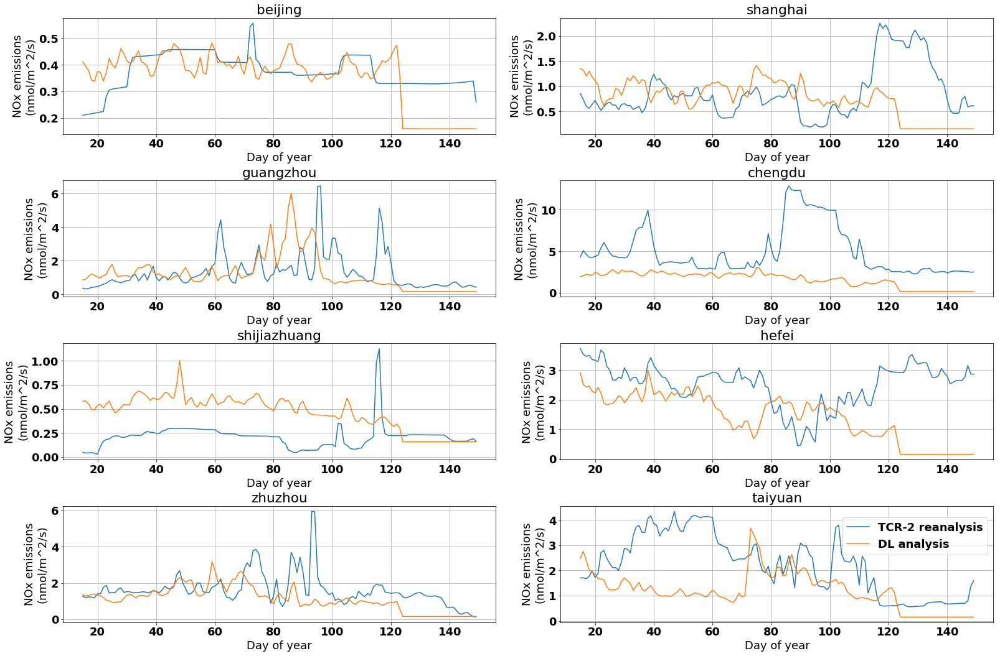

In [317]:
plt.figure(figsize=(25, 15))
curr = 1
for cc in cities:
    subnow = df.loc[ df['Station'] == cc ]

    time  = subnow['Date'].values

    time = np.array([datetime.strptime(s, '%Y-%m-%d') for s in time])

    doy = np.array([s.timetuple().tm_yday for s in time])

    lonnow = subnow['Lon'].values[0]
    latnow = subnow['Lat'].values[0]

    ix = np.argmin( abs(lonnow - lon) )
    iy = np.argmin( abs(latnow - lat) )
    it = doy - 3

    truthnow = truth_hr[:, iy, ix]
    prednow = pred_hr[:, iy, ix]
    
    xx = np.arange(15, 151, 1)

    ax = plt.subplot(4, 2, curr)
    ax.plot(xx[:-1], truthnow[:-1], label='TCR-2 reanalysis')
    ax.plot(xx[:-1], prednow[:-1], label='DL analysis')
    
    ax.grid()
    plt.ylabel('NOx emissions\n(nmol/m^2/s)')
    plt.xlabel('Day of year')
    plt.title(cc)
    
    curr += 1
    

plt.subplots_adjust(left=0.05, wspace=0.15, hspace=0.4, right=0.88, top=0.95, bottom=0.05)
ax.legend(bbox_to_anchor=(1.00, 0.95))